# Baseline

Задание:
1. выбрать метрику оценки качества;
2. разработать baseline;
3. реализовать выбранное решение(я);
4. протестировать работу baseline;
5. выбрать итоговое решение для дальнейшей оптимизации.

# Метрика оценки качества

Проверять качество моделей мы будем на основе данных, которые получили из характеристик для обучающего датасета, и по (под)категориям, метке "товар для взрослых" для тестовых данных. Особенность всех характеристик и категорий - сильная несбалансированность классов. В связи с этим оценка качества классификации будет ппроводиться с использованием метрик `F1-macro` и `F1-avg`.

# Разработка baseline

На втором этапе мы рассмотрели подходы, которые могут быть использованы в решениях задач электронной коммерции. На основе проведенного анализа можно выделить несколько моделей, которые могут быть использованы в качестве baseline:

1. `ruCLIP`: модель обучалась на большом наборе данных, представляющих собой пару картинка - текстовое описание к ней на русском языке. В процессе обучения косинусная близость текстовых эмбеддингов и эмбеддингов картинок от "правильных" пар увеличиватся, а от "неправильных" уменьшается. CLIP модели показывают хорошие результаты по точности в задаче zero-shot классификации, также хорошо работают для поиска похожих картинок по одному описанию. Недостатком данной модели может быть небольшое контекстное окно - 77 токенов. Описния товаров не получится использовать в полной мере;
2. `CLIP-multilingual`: модель с большим контекстным окном, чем у `ruCLIP`, способная работать с 50 языками (в том числе и с русским). 
3. построение `fusion` модели на основе текстового энкодера с большим контекстным окном и энкодера изображений, предобученных на большом наборе данных (текста при этом должны быть русскими или мультиязычными). В качестве текстового энкодера будем использовать `rubert-tiny2` или `ruRoBERTa`, а энкодера изображений - `ViT-B/32`.

In [1]:
import zipfile
import pickle
import itertools

import ruclip
import torch
from transformers import AutoTokenizer, AutoModel
from sentence_transformers import SentenceTransformer

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

from PIL import Image
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
import seaborn as sns

import umap
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.metrics import (f1_score, classification_report, silhouette_score, 
                             adjusted_mutual_info_score, v_measure_score, 
                             homogeneity_score, completeness_score)
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans

from tqdm.notebook import tqdm
import swifter

from IPython.display import clear_output
import warnings

In [2]:
warnings.filterwarnings('ignore')
sns.set(style='darkgrid')
tqdm.pandas()
swifter.set_defaults(allow_dask_on_strings=True,)

## `ruCLIP`

In [3]:
def get_images(file_names: list) -> list[Image.Image]:
    """
    Загрузка изображений из zip-файла по списку имен файлов, преобразование из BGR(или GrayScale) в RGB,
    возврат списка всех преобразованных изображений в формате PIL Image.
    """
    images = []
    
    with zipfile.ZipFile(path_to_zip, 'r') as zf:
        for file_name in file_names:
            img = Image.open(zf.open(file_name))
            
            if img.mode == 'RGB':
            # переводим из формата BGR в RGB
                B, G, R = img.split()
                images.append(Image.merge("RGB", (R, G, B)))
                
            elif img.mode == 'L':
                # переводим из серого в RGB
                images.append(img.convert('RGB'))
                
            else:
                print('Skipping', file_name)
            
    return images

In [4]:
def get_image_vecs(df, predictor, batch=512):
    """
    Функция для получения эмбеддингов изображений.
    """
    ids = df.nm.values
    batches = [ids[i:i+batch] for i in range(0, len(ids), batch)]
    image_latents = []
    
    for batch in tqdm(batches):
        images = get_images([str(id) + '.jpg' for id in batch])
        
        with torch.no_grad():
            latents = predictor.get_image_latents(images)
            
        image_latents.extend(zip(batch, latents.cpu().numpy()))
    
    clear_output()
    return image_latents

In [5]:
def get_embeddings(df, param, predictor, batch=512):
    """
    Функция для получения эмбеддингов текста ruCLIP.
    """
    ids = df.nm.values
    batches = [ids[i:i+batch] for i in range(0, len(ids), batch)]
    latents = []
    
    for batch in tqdm(batches):
        values = df[df.nm.isin(batch)][param].values
        if param == 'nm':
            values = get_images([str(nm) + '.jpg' for nm in batch])
        
        with torch.no_grad():
            if param == 'nm':
                batch_latents = predictor.get_image_latents(values)
            else:
                batch_latents = predictor.get_text_latents(values)
            
        latents.extend(zip(batch, batch_latents.cpu().numpy()))
        
    clear_output()
    return latents

In [6]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'

# загружаем самую базовую модель
clip, processor = ruclip.load('ruclip-vit-base-patch32-224', device=device)

templates = ['{}', 'это товар {}', 'на картинке товар {}', 'на картинке вещь {}', 'это вещь {}']
predictor = ruclip.Predictor(clip, processor, device=device, templates=templates)

In [7]:
# путь до файлов с данными и изображениями
path_to_files = 'D:/HorizontalML/'
path_to_zip = path_to_files + 'wb_school_horizcv_images.zip'

In [8]:
# test = pd.read_parquet(path_to_files + 'test_preprocessed.parquet')
# 
# res_img = get_image_vecs(test, predictor)
# 
# with open(path_to_files + 'test_ruclip_img.pkl', 'wb') as f:
#     pickle.dump(res_img, f)

# for name in ['title', 'description']:
#     res_text = get_embeddings(test, name, predictor)
    
#     with open(path_to_files + f'test_ruclip_{name}.pkl', 'wb') as f:
#         pickle.dump(res_text, f)

In [9]:
def get_saved_ruclip_vecs(df_name):
    """
    Функция для загрузки данных и рассчитанных с помощью ruCLIP эмбеддингов.
    """
    df = pd.read_parquet(path_to_files + f'{df_name}_preprocessed.parquet')
    latents = df[['nm']]
    
    for name, pkl in zip(['img_vec', 'title_vec', 'desc_vec'], 
                     [f'{df_name}_ruclip_img.pkl', f'{df_name}_ruclip_title.pkl', f'{df_name}_ruclip_description.pkl']):
    
        with open(path_to_files + pkl, 'rb') as f:
            vecs = pd.DataFrame(pickle.load(f), columns=['nm', name])
            latents = latents.merge(vecs, on='nm', how='left')

    df = df.merge(latents, on='nm', how='left')
    
    return df

In [116]:
train = get_saved_ruclip_vecs('train')
# test = get_saved_ruclip_vecs('test')

### Zero-shot transfer

Дополнительного обучения не проводится. Для каждого названия класса рассчитывается эмбеддинг, который затем сравнивается с усредненным эмбеддингом от пары текст-картинка. Таким образом определяется наиболее вероятных класс, к которому относится товар.

In [11]:
# здесь сравниваются метрики f1 моделей на основе заголовок + картинка
zero_shot_f1_all = pd.DataFrame(columns=pd.MultiIndex.from_tuples([('ruclip', 'f1_macro'), ('ruclip', 'f1_avg')]))

# здесь сравниваются метрики f1 моделей на основе заголовок + описание
zero_shot_f1_text_only = pd.DataFrame(columns=pd.MultiIndex.from_tuples([('ruclip', 'f1_macro'), ('ruclip', 'f1_avg')]))

# сюда записываются лучшие комбинации из тройки заголовок-описание-картинка
zero_shot_best_comb_all = pd.DataFrame(columns=pd.MultiIndex.from_tuples([('ruclip', 'f1_macro'), ('ruclip', 'f1_avg')]))

#### Дубликаты

Для начала посмотрим, как исходная модель работает с одинаковыми названиями и немного отличающимися картинками. Выберем по паре дубликатов и построим матрицу для сравнения косинусной близости.

In [12]:
def plot_similarities(texts: list[str], 
                      images: list[Image.Image],
                      text_latents: np.ndarray, 
                      image_latents: np.ndarray):
    """
    Функция для построения матрицы косинусного сходства эмбеддингов текста и изображений.
    """
    cos_sim = cosine_similarity(text_latents, image_latents)
    
    fig = plt.figure(figsize=(10, 9))
    sns.heatmap(cos_sim,
                annot=True, 
                fmt='.2f', 
                cmap='coolwarm',
                yticklabels=[text[:30] + '...' if len(text) > 30 else text for text in texts], 
                xticklabels=[''] * len(texts), 
                linewidths=1, 
                cbar=False)
    plt.tick_params(bottom=False, left=False)

    ax = plt.gca()
    tick_labels = ax.xaxis.get_ticklabels()

    for i,im in enumerate(images):
        ib = OffsetImage(im, zoom=.06)
        ib.image.axes = ax
        ab = AnnotationBbox(ib,
                            tick_labels[i].get_position(),
                            frameon=False,
                            box_alignment=(0.5, 0)
                    )
        ax.add_artist(ab)

In [13]:
# выделим все дубликаты по паре заголовок-описание
all_dups = train[train.duplicated(subset=['title', 'description'], keep=False)].sort_values(by=['title', 'description'])
# пронумеруем все товары в группах дубликатов
all_dups['group_num'] = all_dups.groupby('title').title.rank(method='first')

# выделим только пары дубликатов
dup_pairs = all_dups[all_dups.group_num <= 2]

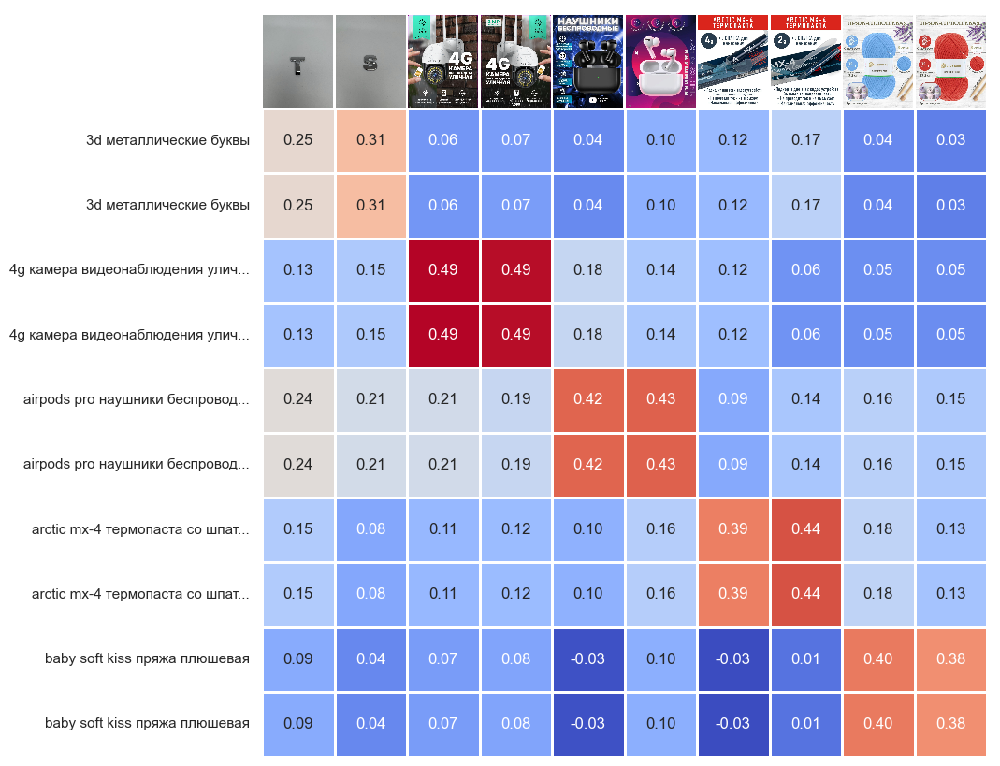

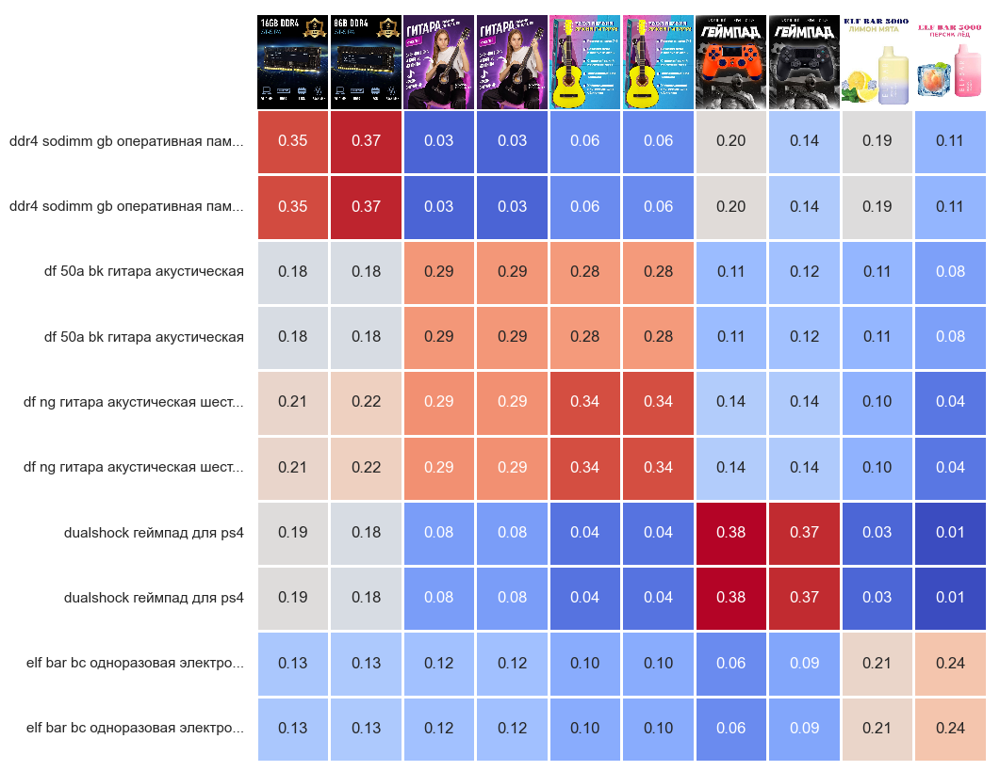

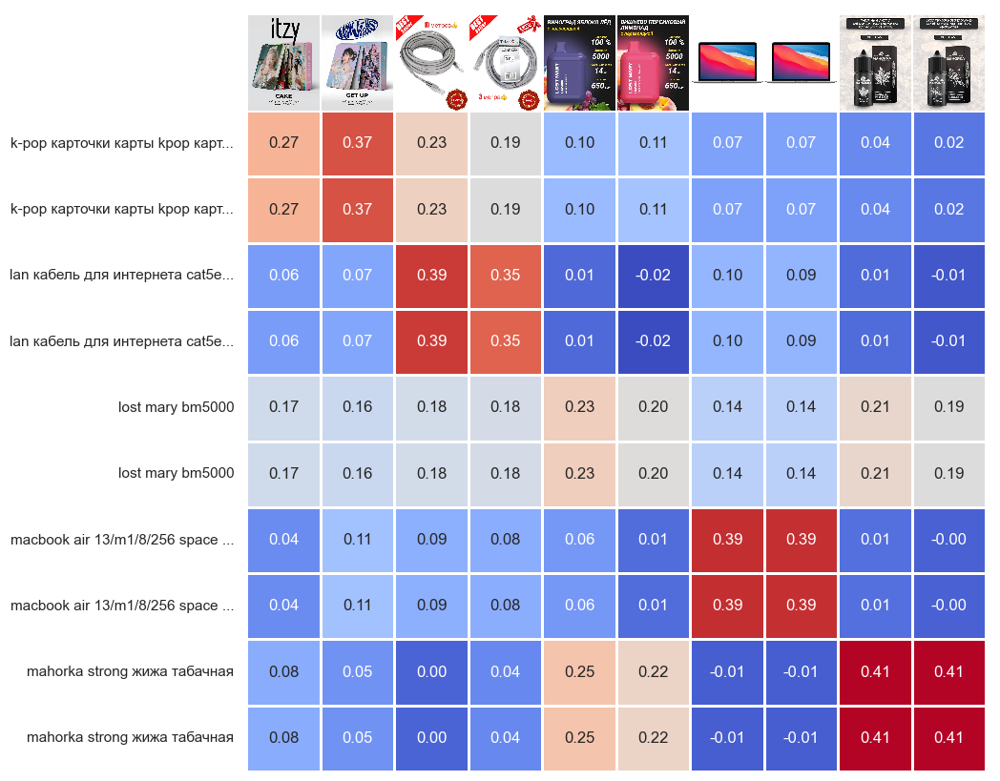

In [14]:
N = 10  # число товаров для одной матрицы

for i in [0, 5, 10]:
    part = dup_pairs.iloc[i * N:(i + 1) * N]
    images = get_images([str(id) + '.jpg' for id in part.nm])
    
    plot_similarities(part.title, images, 
                      np.array(part.title_vec.tolist()), 
                      np.array(part.img_vec.tolist()))

#### Возрастные ограничения

В характеристиках возрастные ограничения указываются как попало. Мы их преобразовали в следующие:
- без ограничений;
- для малышей;
- для детей;
- для подростков;
- для взрослых.

Скорее всего возникнут проблемы при выборе между "для малышей", "для детей", "для подростков". Проведем две оценки качества. В первом случае будут все указанные классы, во втором - "для подростков", "для детей" и "для малышей" объедим в "для детей". 

In [15]:
def get_most_probable_class(row, class_latents, classes, features=None):
    """
    Функция для определения наиболее вероятного класса исходя из косинусного сходства среднего 
    эмбеддинга картинка-заголовок и эмбеддинга класса.
    """
    if features is None:
        features = ['img_vec', 'title_vec']
    
    # средний вектор пары картинка-текст
    mean_vec = np.mean([np.array(row[feature].tolist()) for feature in features], axis=0)
    
    # сравнение эмбеддинга класса со средним вектором
    cos_sim = cosine_similarity(class_latents, mean_vec.reshape(1, -1))
    
    # выбираем тот класс, эмбеддинг которого ближевсего к среднему эмбеддингу
    return classes[cos_sim.argmax()]

In [16]:
def plot_cossim_image_title(df, param, class_latents, classes, random_state=42):
    """
    Функция для построения значений косинусного сходства между средним эмбедднгом изображение-заголовк и эмбеддингом класса а также 
    вывода текста заголовка и построения изображения.
    """
    color_1 = (0.2980392156862745, 0.4470588235294118, 0.6901960784313725)
    color_2 = (0.8666666666666667, 0.5176470588235295, 0.3215686274509804)
    
    fig = plt.figure(figsize=(8, 16), constrained_layout=True)

    products = df[df[param].notna()].sample(5, random_state=42)
    images = get_images([str(nm) + '.jpg' for nm in products.nm])

    subfigs = fig.subfigures(5, 1)
    for i, product in enumerate(products.itertuples()):
        subfigs[i].suptitle(product.title)

        mean_vec = (np.array(product.img_vec) + np.array(product.title_vec)) / 2
        cos_sim = cosine_similarity(class_latents, mean_vec.reshape(1, -1)).reshape(-1)
        
        if cos_sim.min() < 0:
            cos_sim -= cos_sim.min()
        
        cos_sim /= np.sum(cos_sim)
        
        colors = [color_1 if cl != product.__getattribute__(param) else color_2 for cl in classes]

        axes = subfigs[i].subplots(1, 2)
        sns.barplot(y=classes, x=cos_sim, ax=axes[0], palette=colors)

        axes[1].imshow(images[i])
        axes[1].axis('off')

    plt.show()

In [17]:
def get_bert_embeddings(text, model, tokenizer):
    t = tokenizer(text, padding=True, truncation=True, return_tensors='pt', max_length=2048)
    
    with torch.no_grad():
        model_output = model(**{k: v.to(model.device) for k, v in t.items()})
        
    embeddings = model_output.last_hidden_state[:, 0, :]
    embeddings = torch.nn.functional.normalize(embeddings)
    
    return embeddings[0].cpu().numpy()


def zero_shot_transfer_for_class(df, param, model, model_name, 
                                 features=None,
                                 tokenizer=None,
                                 show_report=True,
                                 plot_class_preds=True, 
                                 add_res_to_table=None):
    """
    Получение результатов классификация без какого-либо обучения, только на основе сравнения косинусного сходства.
    """
    
    classes = df[param].cat.categories.values
    
    if model_name == 'ruclip':
        class_latents = model.get_text_latents(classes).detach().cpu().numpy()
        
    elif model_name == 'clip-multilingual-v1':
        class_latents = model.encode(classes)
        
    elif 'bert' in model_name.lower():
        class_latents = np.array([get_bert_embeddings(cl, model, tokenizer) for cl in classes])

    preds = df[df[param].notna()].apply(lambda row: get_most_probable_class(row, class_latents, classes, features), axis=1)
    
    if show_report:
        print(classification_report(df[df[param].notna()][param], preds, target_names=classes))
    
    # добавляем значения в общуюю сравнительную таблицу 
    if add_res_to_table is not None:
        add_res_to_table.loc[param, (model_name, 'f1_macro')] = f1_score(df[df[param].notna()][param], preds, average='macro')
        add_res_to_table.loc[param, (model_name, 'f1_avg')] = f1_score(df[df[param].notna()][param], preds, average='weighted')
    
    if plot_class_preds:
        plot_cossim_image_title(df, param, class_latents, classes)

In [18]:
# объединим "для малышей" и "для подростков" в "для детей"
train['age_restrictions_short'] = train['age_restrictions'].replace(['без ограничений', 'для малышей', 'для подростков'], 
                                                                    ['для всех возрастов', 'для детей', 'для детей'])

                 precision    recall  f1-score   support

без ограничений       0.01      0.02      0.01       153
   для взрослых       0.12      0.31      0.17       331
      для детей       0.70      0.29      0.41      2003
    для малышей       0.44      0.68      0.53      1044
 для подростков       0.37      0.24      0.29       871

       accuracy                           0.36      4402
      macro avg       0.33      0.31      0.28      4402
   weighted avg       0.50      0.36      0.38      4402



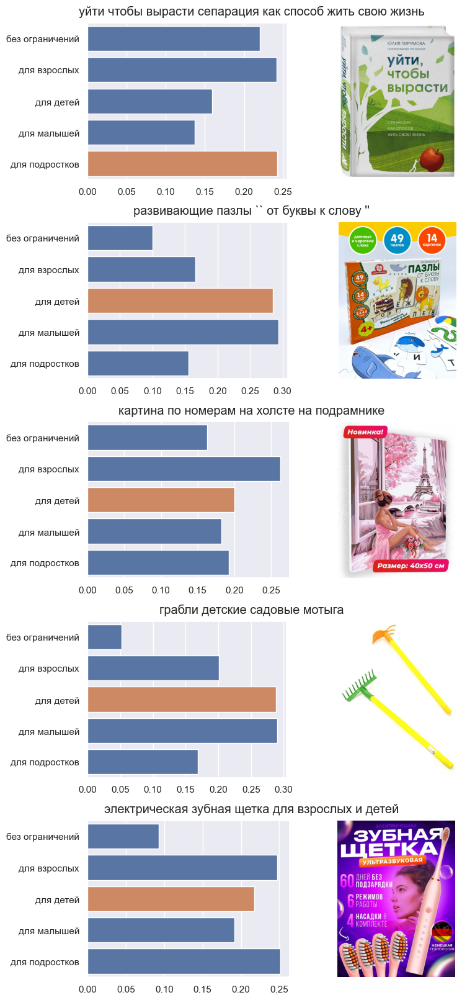

                    precision    recall  f1-score   support

для всех возрастов       0.18      0.66      0.28       331
      для взрослых       0.03      0.20      0.06       153
         для детей       0.97      0.56      0.71      3918

          accuracy                           0.56      4402
         macro avg       0.39      0.47      0.35      4402
      weighted avg       0.88      0.56      0.66      4402



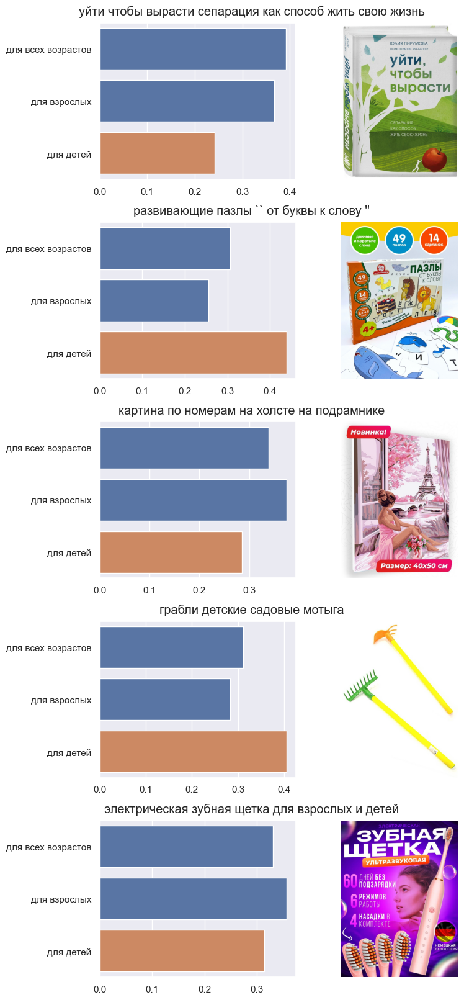

In [19]:
zero_shot_transfer_for_class(train, 'age_restrictions', predictor, 'ruclip', add_res_to_table=zero_shot_f1_all)
zero_shot_transfer_for_class(train, 'age_restrictions_short', predictor, 'ruclip', add_res_to_table=zero_shot_f1_all)

Также рассмотрим случаи, когда для классификации используются эмбеддинги: 
1. только заголовка;
2. только описания;
3. только картинки;
4. заголовка и картинки;
5. описания и картинки;
6. заголовка и описания;
7. заголовка, описания и картинки.

In [20]:
def zero_shot_best_embeds_combination(df, param, model, model_name) -> pd.DataFrame:
    """
    Функция для расчета метрик качества классификации на основе различных комбинаций векторов заголовок-описние-картинка.
    """
    features = ['img_vec', 'title_vec', 'desc_vec']
    feature_combs = [(feature, ) for feature in features] + list(itertools.combinations(features, 2))
    feature_combs.append(tuple(features))

    classes = train[param].cat.categories.values
    
    if model_name == 'ruclip':
        class_latents = predictor.get_text_latents(classes).detach().cpu().numpy()
        
    elif model_name == 'clip-multilingual-v1':
        class_latents = model.encode(classes)
        
    results = pd.DataFrame(columns=['f1_macro', 'f1_avg'])
    
    df = df[df[param].notna()].copy()

    for feature_comb in feature_combs:
        preds = df.apply(lambda row: get_most_probable_class(row, class_latents, classes, feature_comb), axis=1)

        name = ' + '.join([t.split('_')[0] for t in feature_comb])
        results.loc[name, 'f1_macro'] = f1_score(df[param], preds, average='macro')
        results.loc[name, 'f1_avg'] = f1_score(df[param], preds, average='weighted')
    
    results = results.astype(float)
    zero_shot_best_comb_all.loc[param, (model_name, 'f1_macro')] = results['f1_macro'].idxmax()
    zero_shot_best_comb_all.loc[param, (model_name, 'f1_avg')] = results['f1_avg'].idxmax()
    
    zero_shot_f1_text_only.loc[param, (model_name, 'f1_macro')] = results.loc['title + desc', 'f1_macro']
    zero_shot_f1_text_only.loc[param, (model_name, 'f1_avg')] = results.loc['title + desc', 'f1_avg']
        
    return results

In [21]:
res = zero_shot_best_embeds_combination(train, 'age_restrictions', predictor, 'ruclip')
res.style.highlight_max(axis=0, color='lightgreen')

,f1_macro,f1_avg
img,0.275403,0.370093
title,0.254654,0.331640
desc,0.242320,0.278719
img + title,0.282727,0.383034
img + desc,0.268586,0.336749
title + desc,0.254672,0.309089
img + title + desc,0.269595,0.344210


In [22]:
res = zero_shot_best_embeds_combination(train, 'age_restrictions_short', predictor, 'ruclip')
res.style.highlight_max(axis=0, color='lightgreen')

,f1_macro,f1_avg
img,0.311689,0.571491
title,0.367149,0.677397
desc,0.327291,0.587843
img + title,0.349355,0.657016
img + desc,0.332368,0.605943
title + desc,0.359266,0.647618
img + title + desc,0.348485,0.641704


#### Пол

Из характеристик мы выделили следующую классификацию:
- Детский;
- Девочки;
- Мальчики;
- Женский;
- Мужской.

По скольку "Мальчики" и "Девочки" по сути являются подклассом "Детский", то можно ожидать больше всего ошибок при данных классификациях. Как и в случае с возрастными ограничениями, проведем две оценки качества. 

              precision    recall  f1-score   support

     Девочки       0.67      0.40      0.50      2379
     Детский       0.70      0.67      0.69      4597
     Женский       0.83      0.89      0.86     10614
    Мальчики       0.42      0.42      0.42      1226
     Мужской       0.69      0.74      0.72      3672

    accuracy                           0.75     22488
   macro avg       0.66      0.63      0.64     22488
weighted avg       0.74      0.75      0.74     22488



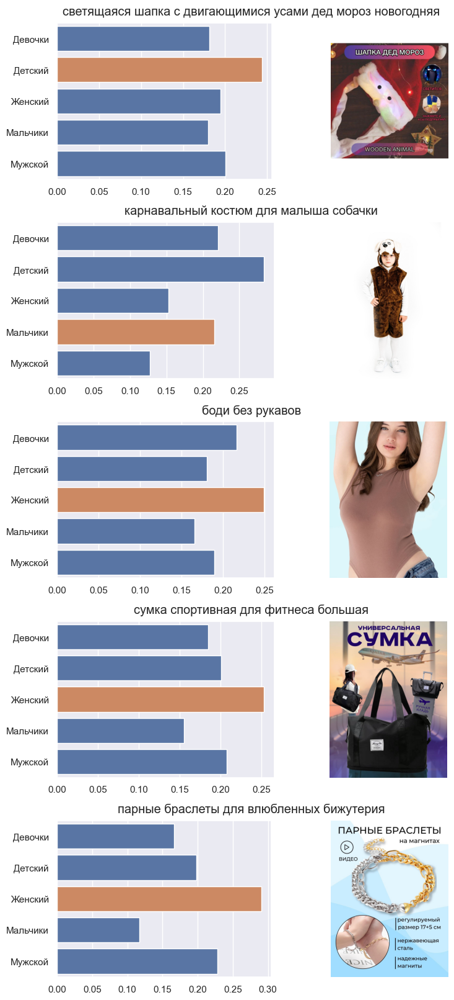

In [23]:
zero_shot_transfer_for_class(train, 'sex', predictor, 'ruclip', add_res_to_table=zero_shot_f1_all)

In [24]:
train['sex_short'] = train['sex'].replace(['Мальчики', 'Девочки'], ['Детский', 'Детский'])

              precision    recall  f1-score   support

     Детский       0.95      0.69      0.80      8202
     Женский       0.80      0.91      0.85     10614
     Мужской       0.65      0.77      0.70      3672

    accuracy                           0.81     22488
   macro avg       0.80      0.79      0.78     22488
weighted avg       0.83      0.81      0.81     22488



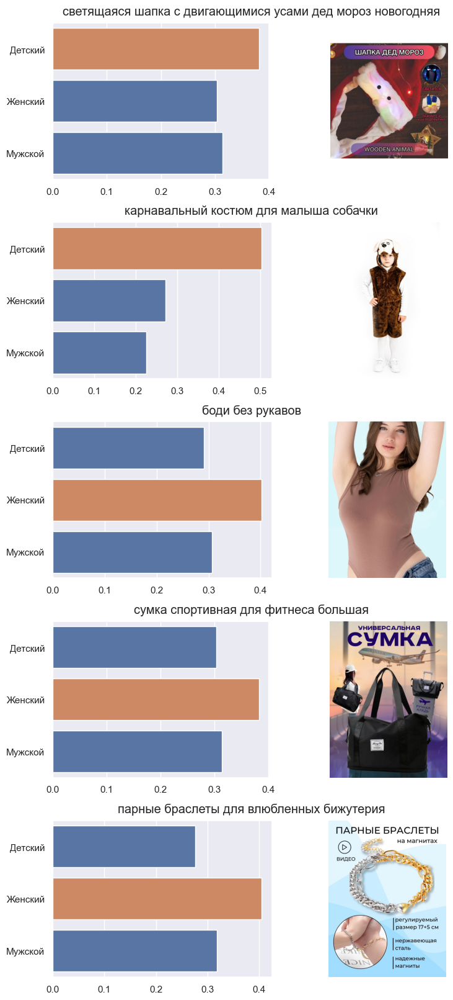

In [25]:
zero_shot_transfer_for_class(train, 'sex_short', predictor, 'ruclip', add_res_to_table=zero_shot_f1_all)

In [26]:
zero_shot_best_embeds_combination(train, 'sex', predictor, 'ruclip').style.highlight_max(axis=0, color='lightgreen')

,f1_macro,f1_avg
img,0.577068,0.677485
title,0.539159,0.649650
desc,0.662013,0.745774
img + title,0.635640,0.738568
img + desc,0.699024,0.782102
title + desc,0.670708,0.761374
img + title + desc,0.698982,0.786830


In [27]:
zero_shot_best_embeds_combination(train, 'sex_short', predictor, 'ruclip').style.highlight_max(axis=0, color='lightgreen')

,f1_macro,f1_avg
img,0.750996,0.779600
title,0.688099,0.723294
desc,0.811752,0.835800
img + title,0.783362,0.806948
img + desc,0.834908,0.854593
title + desc,0.805544,0.825660
img + title + desc,0.829763,0.848583


#### Сезонность

                precision    recall  f1-score   support

     демисезон       0.21      0.72      0.32      2025
          зима       0.49      0.57      0.53      1642
круглогодичный       0.81      0.03      0.05      5537
          лето       0.28      0.36      0.32       710

      accuracy                           0.28      9914
     macro avg       0.45      0.42      0.30      9914
  weighted avg       0.59      0.28      0.21      9914



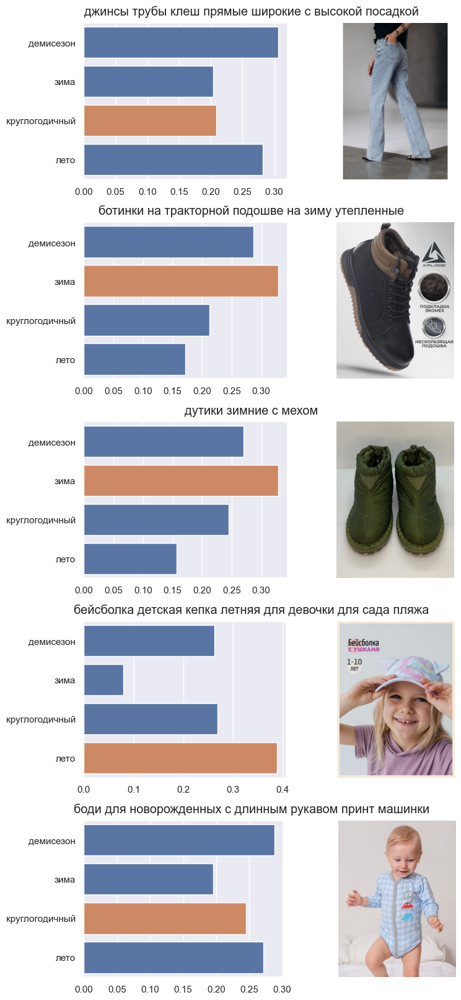

In [28]:
zero_shot_transfer_for_class(train, 'season', predictor, 'ruclip', add_res_to_table=zero_shot_f1_all)

In [29]:
zero_shot_best_embeds_combination(train, 'season', predictor, 'ruclip').style.highlight_max(axis=0, color='lightgreen')

,f1_macro,f1_avg
img,0.300406,0.273600
title,0.293738,0.199077
desc,0.316964,0.235434
img + title,0.304601,0.205085
img + desc,0.324243,0.232251
title + desc,0.316489,0.216318
img + title + desc,0.323024,0.217993


#### Хрупкость

              precision    recall  f1-score   support

  не хрупкий       0.62      0.41      0.49      4773
     хрупкий       0.35      0.56      0.43      2681

    accuracy                           0.46      7454
   macro avg       0.48      0.48      0.46      7454
weighted avg       0.52      0.46      0.47      7454



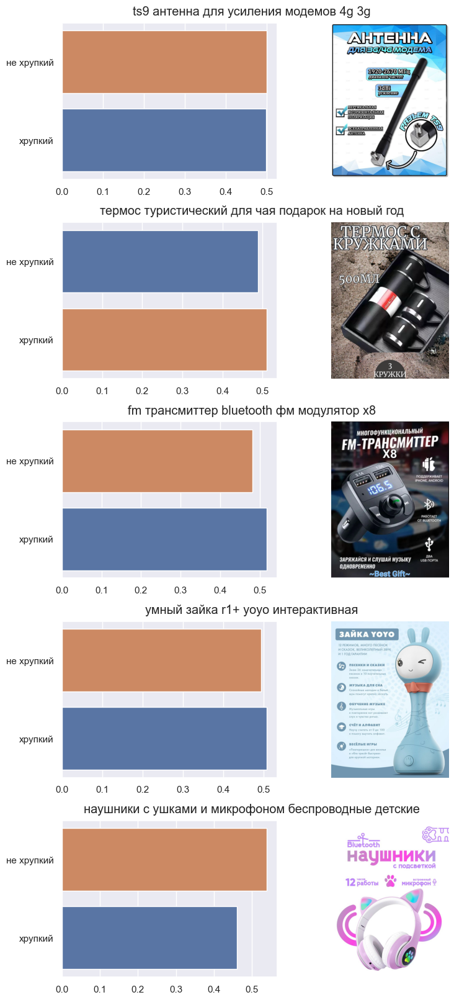

In [30]:
zero_shot_transfer_for_class(train, 'fragility', predictor, 'ruclip', add_res_to_table=zero_shot_f1_all)

In [31]:
zero_shot_best_embeds_combination(train, 'fragility', predictor, 'ruclip').style.highlight_max(axis=0, color='lightgreen')

,f1_macro,f1_avg
img,0.491506,0.507110
title,0.454256,0.461037
desc,0.481643,0.506059
img + title,0.459648,0.468519
img + desc,0.487812,0.508601
title + desc,0.465120,0.480889
img + title + desc,0.468798,0.484258


#### Результаты

In [32]:
zero_shot_f1_all.style.highlight_max(axis=0, color='lightgreen')

In [33]:
# лучшие комбинации эмбеддингов
zero_shot_best_comb_all

ruclip                    
                           f1_macro              f1_avg
age_restrictions        img + title         img + title
age_restrictions_short        title               title
sex                      img + desc  img + title + desc
sex_short                img + desc          img + desc
season                   img + desc                 img
fragility                       img          img + desc

### Linear probe

Обученная модель "замораживается", обучается только линейный классификатор, построенный на получаемых эмбеддингах от пар текст-картинка. В качестве линейного классификатора будем использовать логистическую регрессию.

In [34]:
# здесь сравниваются метрики f1 моделей на основе заголовок + картинка
linprob_f1_all = pd.DataFrame(columns=pd.MultiIndex.from_product([['ruclip'], ['f1_macro', 'f1_avg']]),
                              index=pd.MultiIndex.from_tuples([], names=['data', 'fusion']))

# здесь сравниваются метрики f1 моделей на основе только заголовков и описания
linprob_f1_text_only = pd.DataFrame(columns=pd.MultiIndex.from_product([['ruclip'], ['f1_macro', 'f1_avg']]),
                                    index=pd.MultiIndex.from_tuples([], names=['data', 'fusion']))

In [35]:
def get_data(df, param, is_img=True):
    """
    Функция для получения конкатенированных векторов изображения и текста.
    """
    df = df[df[param].notna()].copy()
    
    if is_img:
        X_concat = np.concatenate([np.array(df[vec].tolist()) for vec in ['img_vec', 'title_vec', 'desc_vec']], axis=1)
    else:
        X_concat = np.concatenate([np.array(df[vec].tolist()) for vec in ['title_vec', 'desc_vec']], axis=1)
        
    y = df[param].values
    
    return train_test_split(X_concat, y, test_size=0.25, random_state=42)

In [36]:
def early_fusion(X_train, y_train, X_test, y_test, clf, model_name, add_res_to_table=None, show_report=True):
    clf.fit(X_train, y_train)
    
    if show_report:    
        print(classification_report(y_test, clf.predict(X_test)))
    
    if add_res_to_table is not None:
        add_res_to_table[0].loc[(add_res_to_table[1], 'early'), (model_name, 'f1_macro')] = f1_score(y_test, clf.predict(X_test), average='macro')
        add_res_to_table[0].loc[(add_res_to_table[1], 'early'), (model_name, 'f1_avg')] = f1_score(y_test, clf.predict(X_test), average='weighted')

In [37]:
def late_fusion(X_train, y_train, X_test, y_test, clfs, model_name, add_res_to_table=None, show_report=True):
    n = X_train.shape[1] // (len(clfs) - 1)
    
    for i, clf in enumerate(clfs[:-1]):
        clf.fit(X_train[:, i * n:(i + 1) * n], y_train)
    
    X_late_train = np.concatenate([clf.predict_proba(X_train[:, i * n:(i + 1) * n]) for clf in clfs[:-1]], axis=1)
    X_late_test  = np.concatenate([clf.predict_proba(X_test[:, i * n:(i + 1) * n]) for clf in clfs[:-1]], axis=1)
    
    clfs[-1].fit(X_late_train, y_train)
    
    if show_report:
        if len(clfs) == 4:
            cols = ['Image', 'Title', 'Description']
        else:
            cols = ['Title', 'Description']
            
        for i, clf in enumerate(clfs[:-1]):
            print(f'{cols[i]} classifier F1-macro: {f1_score(y_test, clf.predict(X_test[:, i * n:(i + 1) * n]), average="macro"):.2f}')

        print(classification_report(y_test, clfs[-1].predict(X_late_test)))
    
    if add_res_to_table is not None:
        add_res_to_table[0].loc[(add_res_to_table[1], 'late'), (model_name, 'f1_macro')] = \
        f1_score(y_test, clfs[-1].predict(X_late_test), average='macro')
        add_res_to_table[0].loc[(add_res_to_table[1], 'late'), (model_name, 'f1_avg')] = \
        f1_score(y_test, clfs[-1].predict(X_late_test), average='weighted')

In [38]:
def plot_classification_image_title(df, param, clfs, fusion_type='early', random_state=42):
    color_1 = (0.2980392156862745, 0.4470588235294118, 0.6901960784313725)
    color_2 = (0.8666666666666667, 0.5176470588235295, 0.3215686274509804)
    
    products = df.sample(5, random_state=42)
    X = np.concatenate([np.array(products[vec].tolist()) for vec in ['img_vec', 'title_vec', 'desc_vec']], axis=1)
    nms = products.nm.values
    y = products[param].values
    
    if fusion_type == 'early':
        if isinstance(clfs, list):
            pass
        else:
            clfs = [clfs]
            
    elif fusion_type == 'late':
        pass
        
    else:
        raise ValueError(f'Unknown fusion type: {fusion_type}')
    
    fig = plt.figure(figsize=(8, 16), constrained_layout=True)
    
    images = get_images([str(nm) + '.jpg' for nm in nms])
    
    if fusion_type == 'early':
        preds = clf.predict_proba(X)

    elif fusion_type == 'late':
        n = X.shape[1] // (len(clfs) - 1)
        X_late = np.concatenate([clf.predict_proba(X[:, i * n:(i + 1) * n]) for i, clf in enumerate(clfs[:-1])], axis=1)

        preds = clfs[-1].predict_proba(X_late)

    subfigs = fig.subfigures(5, 1)
    
    for i, product in enumerate(products.itertuples()):
        subfigs[i].suptitle(product.title)
        
        colors = [color_1 if cl != y[i] else color_2 for cl in clfs[-1].classes_]

        axes = subfigs[i].subplots(1, 2)
        sns.barplot(y=clfs[-1].classes_, x=preds[i], ax=axes[0], palette=colors)

        axes[1].imshow(images[i])
        axes[1].axis('off')

    plt.show()

#### Возрастные ограничения

In [39]:
X_train, X_test, y_train, y_test = get_data(train, 'age_restrictions')

In [40]:
# early fusion
clf = LogisticRegression(solver='lbfgs', penalty='l2', max_iter=1000)
early_fusion(X_train, y_train, X_test, y_test, clf, 'ruclip', add_res_to_table=(linprob_f1_all, 'age_restrictions'))

                 precision    recall  f1-score   support

без ограничений       0.20      0.05      0.08        43
   для взрослых       0.62      0.41      0.49        81
      для детей       0.72      0.81      0.76       518
    для малышей       0.61      0.51      0.56       248
 для подростков       0.60      0.71      0.65       211

       accuracy                           0.66      1101
      macro avg       0.55      0.50      0.51      1101
   weighted avg       0.64      0.66      0.65      1101



Image classifier F1-macro: 0.48
Title classifier F1-macro: 0.47
Description classifier F1-macro: 0.48
                 precision    recall  f1-score   support

без ограничений       0.29      0.05      0.08        43
   для взрослых       0.54      0.41      0.46        81
      для детей       0.70      0.80      0.74       518
    для малышей       0.60      0.48      0.53       248
 для подростков       0.58      0.67      0.63       211

       accuracy                           0.64      1101
      macro avg       0.54      0.48      0.49      1101
   weighted avg       0.63      0.64      0.63      1101



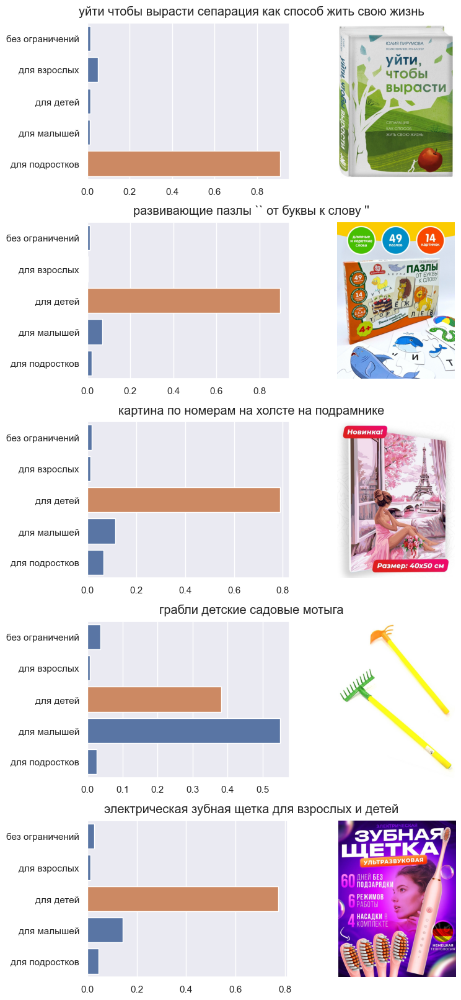

In [41]:
# late fusion
clfs = [LogisticRegression(solver='lbfgs', penalty='l2', max_iter=1000) for _ in range(4)]

late_fusion(X_train, y_train, X_test, y_test, clfs, 'ruclip', add_res_to_table=(linprob_f1_all, 'age_restrictions'))
plot_classification_image_title(train[train.age_restrictions.notna()], 'age_restrictions', clfs, fusion_type='late')

In [42]:
# классификаторы только на основе эмбеддингов заголовка и описания
n = X_train.shape[1] // 3

early_fusion(X_train[:, :n], y_train, X_test[:, :n], y_test, clf, 'ruclip', 
             add_res_to_table=(linprob_f1_text_only, 'age_restrictions'), show_report=False)
late_fusion(X_train[:, n:], y_train, X_test[:, n:], y_test, clfs[1:], 'ruclip', 
            add_res_to_table=(linprob_f1_text_only, 'age_restrictions'), show_report=False)

#### Пол

In [43]:
X_train, X_test, y_train, y_test = get_data(train, 'sex')

In [44]:
# early fusion
clf = LogisticRegression(solver='lbfgs', penalty='l2', max_iter=1000)
early_fusion(X_train, y_train, X_test, y_test, clf, 'ruclip', (linprob_f1_all, 'sex'))

              precision    recall  f1-score   support

     Девочки       0.81      0.72      0.76       600
     Детский       0.81      0.84      0.83      1183
     Женский       0.93      0.96      0.95      2639
    Мальчики       0.78      0.52      0.62       297
     Мужской       0.84      0.86      0.85       903

    accuracy                           0.87      5622
   macro avg       0.83      0.78      0.80      5622
weighted avg       0.87      0.87      0.87      5622



Image classifier F1-macro: 0.69
Title classifier F1-macro: 0.62
Description classifier F1-macro: 0.74
              precision    recall  f1-score   support

     Девочки       0.76      0.67      0.71       600
     Детский       0.77      0.84      0.80      1183
     Женский       0.91      0.94      0.92      2639
    Мальчики       0.72      0.42      0.53       297
     Мужской       0.80      0.80      0.80       903

    accuracy                           0.84      5622
   macro avg       0.79      0.73      0.75      5622
weighted avg       0.84      0.84      0.83      5622



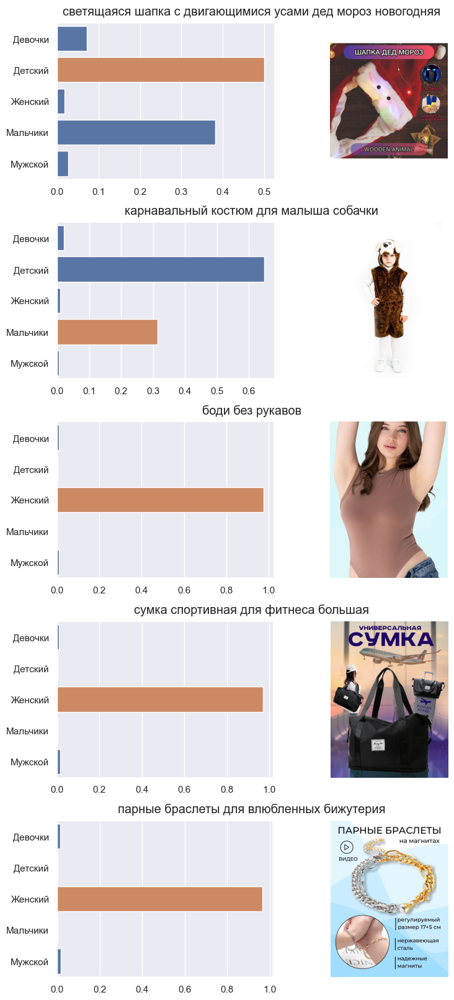

In [45]:
# late fusion
clfs = [LogisticRegression(solver='lbfgs', penalty='l2', max_iter=1000) for _ in range(4)]

late_fusion(X_train, y_train, X_test, y_test, clfs, 'ruclip', (linprob_f1_all, 'sex'))
plot_classification_image_title(train[train.sex.notna()], 'sex', clfs, fusion_type='late')

In [46]:
# классификаторы только на основе эмбеддингов заголовка и описания
n = X_train.shape[1] // 3

early_fusion(X_train[:, :n], y_train, X_test[:, :n], y_test, clf, 'ruclip', 
             add_res_to_table=(linprob_f1_text_only, 'sex'), show_report=False)
late_fusion(X_train[:, n:], y_train, X_test[:, n:], y_test, clfs[1:], 'ruclip', 
            add_res_to_table=(linprob_f1_text_only, 'sex'), show_report=False)

#### Сезонность

In [47]:
X_train, X_test, y_train, y_test = get_data(train, 'season')

In [48]:
# early fusion
early_fusion(X_train, y_train, X_test, y_test,
             LogisticRegression(solver='lbfgs', penalty='l2', max_iter=1000), 'ruclip', (linprob_f1_all, 'season'))

                precision    recall  f1-score   support

     демисезон       0.61      0.48      0.54       495
          зима       0.77      0.78      0.77       410
круглогодичный       0.76      0.88      0.82      1391
          лето       0.62      0.23      0.34       183

      accuracy                           0.74      2479
     macro avg       0.69      0.59      0.62      2479
  weighted avg       0.72      0.74      0.72      2479



Image classifier F1-macro: 0.49
Title classifier F1-macro: 0.56
Description classifier F1-macro: 0.57
                precision    recall  f1-score   support

     демисезон       0.55      0.48      0.52       495
          зима       0.73      0.70      0.71       410
круглогодичный       0.76      0.86      0.81      1391
          лето       0.56      0.22      0.31       183

      accuracy                           0.71      2479
     macro avg       0.65      0.57      0.59      2479
  weighted avg       0.70      0.71      0.70      2479



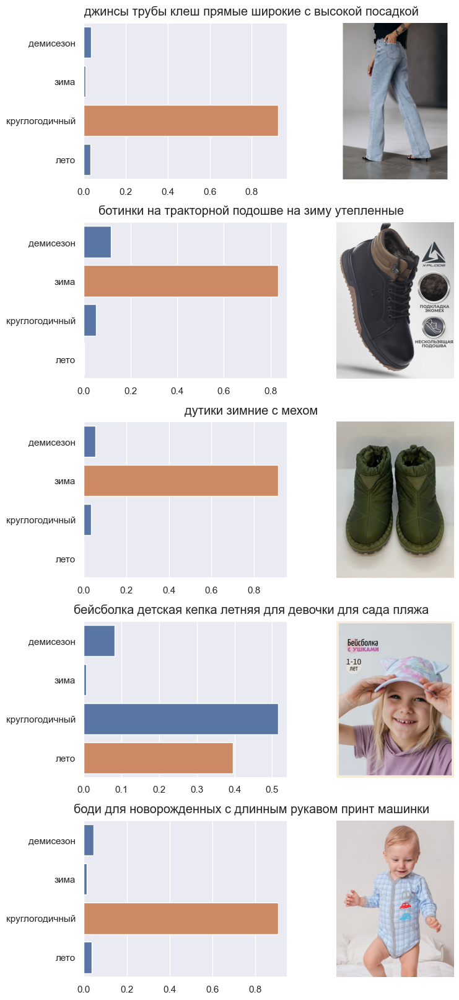

In [49]:
# late fusion
clfs = [LogisticRegression(solver='lbfgs', penalty='l2', max_iter=1000) for _ in range(4)]

late_fusion(X_train, y_train, X_test, y_test, clfs, 'ruclip', (linprob_f1_all, 'season'))
plot_classification_image_title(train[train.season.notna()], 'season', clfs, fusion_type='late')

In [50]:
# классификаторы только на основе эмбеддингов заголовка и описания
n = X_train.shape[1] // 3

early_fusion(X_train[:, :n], y_train, X_test[:, :n], y_test, clf, 'ruclip', 
             add_res_to_table=(linprob_f1_text_only, 'season'), show_report=False)
late_fusion(X_train[:, n:], y_train, X_test[:, n:], y_test, clfs[1:], 'ruclip', 
            add_res_to_table=(linprob_f1_text_only, 'season'), show_report=False)

#### Хрупкость

In [51]:
X_train, X_test, y_train, y_test = get_data(train, 'fragility')

In [52]:
# early fusion
early_fusion(X_train, y_train, X_test, y_test,
             LogisticRegression(solver='lbfgs', penalty='l2', max_iter=1000), 'ruclip', (linprob_f1_all, 'fragility'))

              precision    recall  f1-score   support

  не хрупкий       0.74      0.84      0.79      1190
     хрупкий       0.63      0.48      0.54       674

    accuracy                           0.71      1864
   macro avg       0.69      0.66      0.67      1864
weighted avg       0.70      0.71      0.70      1864



Image classifier F1-macro: 0.58
Title classifier F1-macro: 0.64
Description classifier F1-macro: 0.63
              precision    recall  f1-score   support

  не хрупкий       0.72      0.83      0.77      1190
     хрупкий       0.59      0.44      0.51       674

    accuracy                           0.69      1864
   macro avg       0.66      0.63      0.64      1864
weighted avg       0.68      0.69      0.68      1864



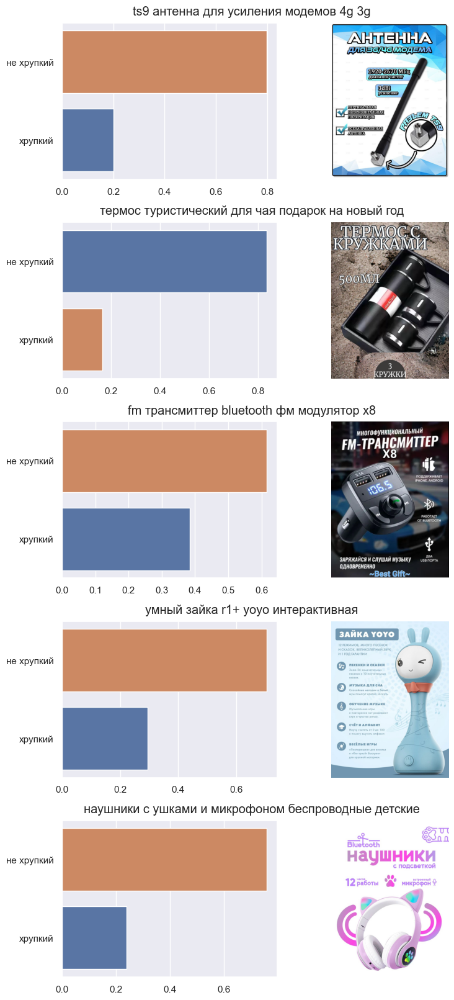

In [53]:
# late fusion 
clfs = [LogisticRegression(solver='lbfgs', penalty='l2', max_iter=1000) for _ in range(4)]

late_fusion(X_train, y_train, X_test, y_test, clfs, 'ruclip', (linprob_f1_all, 'fragility'))
plot_classification_image_title(train[train.fragility.notna()], 'fragility', clfs, fusion_type='late')

In [54]:
# классификаторы только на основе эмбеддингов заголовка и описания
n = X_train.shape[1] // 3

early_fusion(X_train[:, :n], y_train, X_test[:, :n], y_test, clf, 'ruclip', 
             add_res_to_table=(linprob_f1_text_only, 'fragility'), show_report=False)
late_fusion(X_train[:, n:], y_train, X_test[:, n:], y_test, clfs[1:], 'ruclip', 
            add_res_to_table=(linprob_f1_text_only, 'fragility'), show_report=False)

#### Результаты

In [55]:
linprob_f1_all.style.highlight_max(color='lightgreen', axis=0)

In [56]:
zero_shot_f1_all.style.highlight_max(color='lightgreen', axis=0)

In [57]:
linprob_f1_text_only.style.highlight_max(color='lightgreen', axis=0)

### Кластеризация

Вначале берем средний вектор от векторов заголовка, описания и изображения. Уменьшаем размерность векторов с помощью `UMAP` до 128, затем проводим кластеризацию с использованием `KMeans`.

In [58]:
# берем средний вектор от векторов заголовка и изображения
train['mean_vec'] = train[['img_vec', 'title_vec', 'desc_vec']].apply(lambda x: np.mean(x, axis=0), axis=1)

In [59]:
reducer_xy = umap.UMAP()  # для визуализации
reducer = umap.UMAP(n_components=128, random_state=0)

In [60]:
# %%time
# reduced_xy = reducer_xy.fit_transform(train['mean_vec'].tolist())
# reduced_vecs = reducer.fit_transform(np.array(train['mean_vec'].tolist()))

# with open('ruclip_umap_embeddings.pkl', 'wb') as f:
#     pickle.dump([reduced_xy, reduced_vecs], f)

In [61]:
with open(path_to_files + 'ruclip_umap_embeddings.pkl', 'rb') as f:
    reduced_xy, reduced_vecs = pickle.load(f)

In [62]:
kmeans_list = [KMeans(n_clusters=n, random_state=0) for n in range(100, 1001, 100)]
scores = []

for kmeans in tqdm(kmeans_list):
    kmeans.fit(reduced_vecs)
    scores.append(silhouette_score(reduced_vecs, kmeans.predict(reduced_vecs), sample_size=10000))

  0%|          | 0/10 [00:00<?, ?it/s]

In [63]:
def plot_cluster_scores(n_clusters, scores):
    max_score = max(scores)
    best_n = n_clusters[scores.index(max_score)]

    sns.scatterplot(x=[best_n], y=[max_score], color='red')
    plt.text(best_n, max_score - 0.015, f'({best_n}, {max_score:.3f})')
    sns.lineplot(x=n_clusters, y=scores)

    plt.xlabel('Количество кластеров')
    plt.ylabel('Silhouette score')
    
    plt.show();

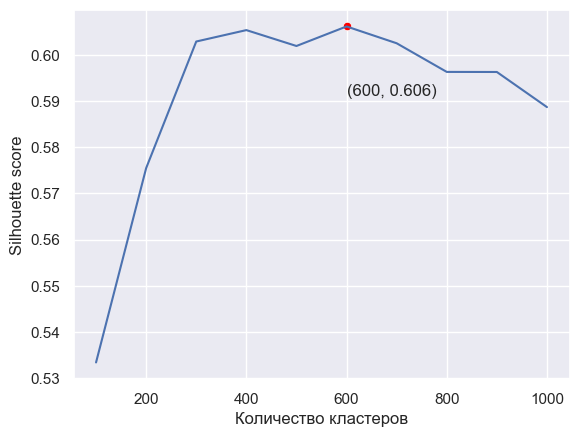

In [64]:
n_clusters = list(range(100, 1001, 100))
plot_cluster_scores(n_clusters, scores)

In [65]:
def plot_best_cluster(best_n, reduced_xy):
    kmeans = KMeans(n_clusters=best_n, random_state=0)
    kmeans.fit(reduced_xy)
    
    labels = kmeans.predict(reduced_xy)
    df = pd.DataFrame({'x': reduced_xy[:, 0], 'y': reduced_xy[:, 1], 'label': labels})
    
    for label in df.label.unique():
        plt.scatter(df[df.label == label].x, df[df.label == label].y, s=1)
    
    plt.title(f'Silhouette score: {silhouette_score(reduced_xy, labels, sample_size=10000):.3f} ({best_n} clusters)')
    plt.show()

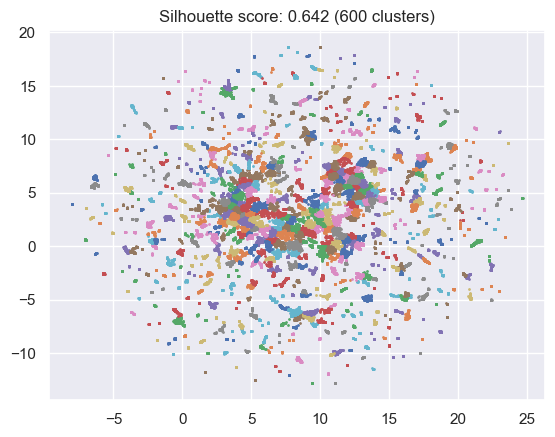

In [66]:
max_score = max(scores)
best_n = n_clusters[scores.index(max_score)]

plot_best_cluster(best_n, reduced_xy)

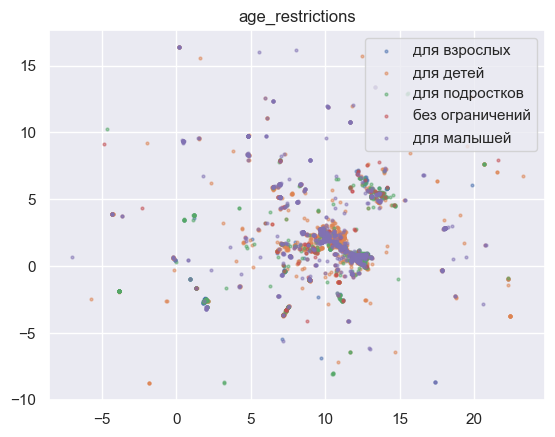

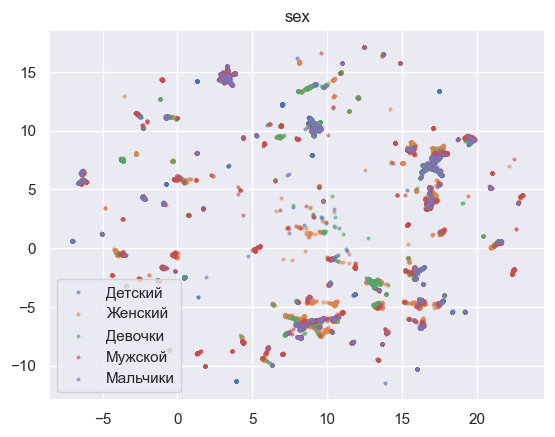

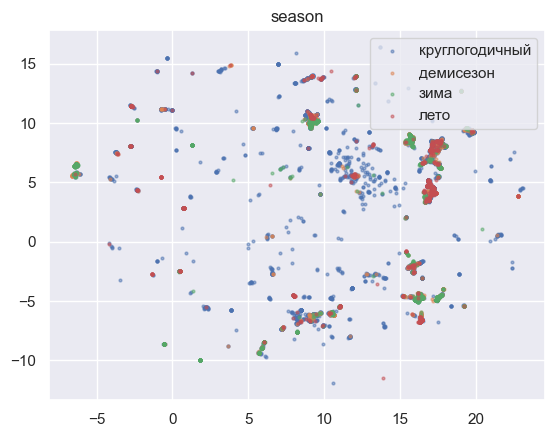

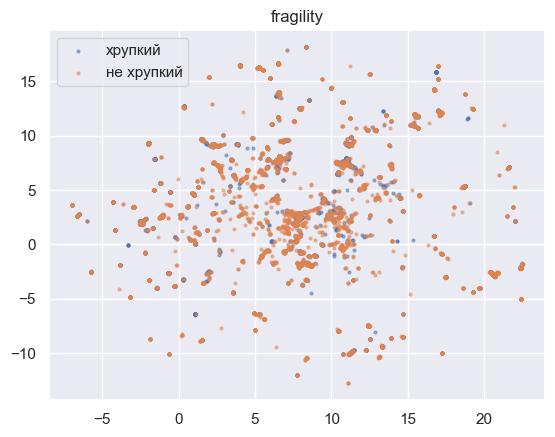

In [67]:
for param in ['age_restrictions', 'sex', 'season', 'fragility']:

    kmeans = KMeans(n_clusters=best_n, random_state=0)
    kmeans.fit(reduced_xy)

    labels = kmeans.predict(reduced_xy)
    df = pd.DataFrame({'x': reduced_xy[:, 0], 'y': reduced_xy[:, 1], 'label': train[param]})

    for label in df.label.unique():
        if label is not np.nan:
            plt.scatter(df[df.label == label].x, df[df.label == label].y, s=4, label=label, alpha=0.5)

    plt.legend()
    plt.title(f'{param}')
    plt.show()

In [68]:
clusterisation_results = pd.DataFrame(columns=pd.MultiIndex.from_product([['ruclip'],['AMI', 'Homogeneity', 'Completeness', 'V-Measure']]))

In [69]:
for param in train.columns[4:-6]:
    idxs = train[train[param].notna()].index
    labels = kmeans_list[scores.index(max_score)].predict(reduced_vecs[idxs])
    
    clusterisation_results.loc[param, :] = [
        adjusted_mutual_info_score(train.loc[idxs, param], labels),
        homogeneity_score(train.loc[idxs, param], labels),
        completeness_score(train.loc[idxs, param], labels),
        v_measure_score(train.loc[idxs, param], labels)
    ]

In [70]:
clusterisation_results

ruclip                                   
                       AMI Homogeneity Completeness V-Measure
sex               0.169268    0.368752     0.113153  0.173169
age_restrictions  0.168877    0.375033     0.131064  0.194244
season            0.108258    0.268287     0.075686  0.118065
fragility         0.032989    0.174354     0.023205  0.040959

In [117]:
# конкатенация эмбеддингов
concat = train[['img_vec', 'title_vec', 'desc_vec']].apply(lambda row: np.concatenate(row.values), axis=1)

In [121]:
%%time
reduced_concat_xy = reducer_xy.fit_transform(concat.tolist())

CPU times: total: 7min 30s
Wall time: 1min 6s


In [123]:
kmeans_list = [KMeans(n_clusters=n, random_state=0) for n in range(100, 1001, 100)]
scores = []

for kmeans in tqdm(kmeans_list):
    kmeans.fit(reduced_concat_xy)
    scores.append(silhouette_score(reduced_concat_xy, kmeans.predict(reduced_concat_xy), sample_size=10000))

  0%|          | 0/10 [00:00<?, ?it/s]

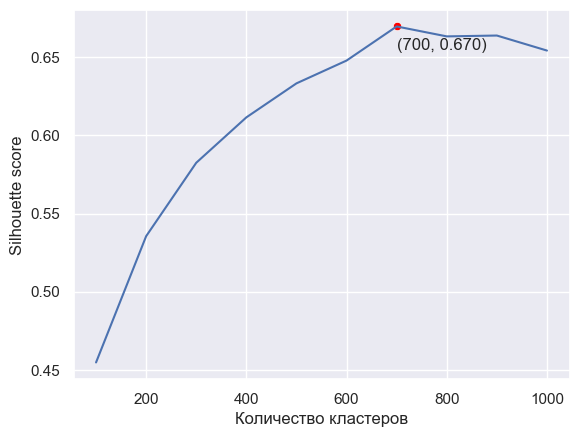

In [126]:
n_clusters = list(range(100, 1001, 100))
plot_cluster_scores(n_clusters, scores)

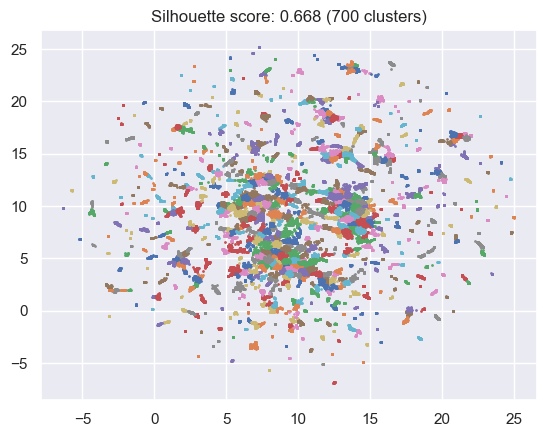

In [125]:
max_score = max(scores)
best_n = n_clusters[scores.index(max_score)]

plot_best_cluster(best_n, reduced_concat_xy)

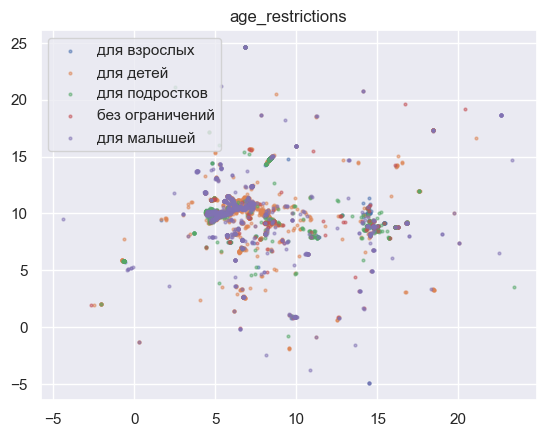

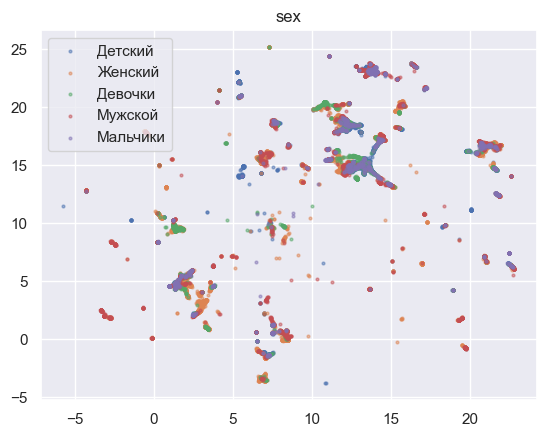

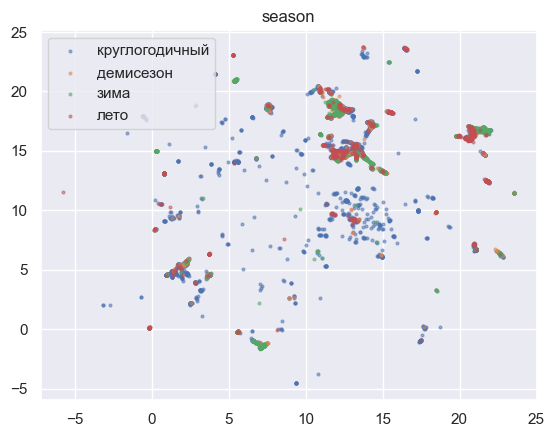

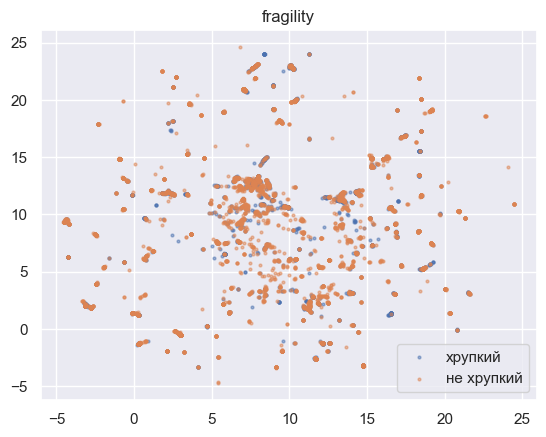

In [127]:
for param in ['age_restrictions', 'sex', 'season', 'fragility']:

    kmeans = KMeans(n_clusters=best_n, random_state=0)
    kmeans.fit(reduced_concat_xy)

    labels = kmeans.predict(reduced_concat_xy)
    df = pd.DataFrame({'x': reduced_concat_xy[:, 0], 'y': reduced_concat_xy[:, 1], 'label': train[param]})

    for label in df.label.unique():
        if label is not np.nan:
            plt.scatter(df[df.label == label].x, df[df.label == label].y, s=4, label=label, alpha=0.5)

    plt.legend()
    plt.title(f'{param}')
    plt.show()

## `clip-ViT-B-32-multilingual-v1`

In [71]:
def get_image_vecs(df, predictor, batch=512):
    """
    Функция для получения эмбеддингов изображений.
    """
    ids = df.nm.values
    batches = [ids[i:i+batch] for i in range(0, len(ids), batch)]
    image_latents = []
    
    for batch in tqdm(batches):
        images = get_images([str(id) + '.jpg' for id in batch])
        
        with torch.no_grad():
            latents = predictor.encode(images)
            
        image_latents.extend(zip(batch, latents))
    
    clear_output()
    return image_latents

In [72]:
img_model = SentenceTransformer('clip-ViT-B-32')
text_model = SentenceTransformer('sentence-transformers/clip-ViT-B-32-multilingual-v1')

In [73]:
# res = get_image_vecs(train, img_model)

# with open(path_to_files + 'train_clip_multilingual-v1_img.pkl', 'wb') as f:
#     pickle.dump(res, f)

# train['title_vec'] = train['title'].swifter.apply(text_model.encode)
# train['desc_vec'] = train['description'].swifter.apply(text_model.encode)

In [74]:
# test = test.drop(['img_vec', 'title_vec', 'desc_vec'], axis=1)

# res = get_image_vecs(test, img_model)

# with open(path_to_files + 'test_clip_multilingual-v1_img.pkl', 'wb') as f:
#     pickle.dump(res, f)
    
# test['title_vec'] = test['title'].progress_apply(text_model.encode)
# test['desc_vec'] = test['description'].progress_apply(text_model.encode)

# test[['nm', 'title_vec', 'desc_vec']].to_parquet(path_to_files + 'test_clip_multilingual-v1.parquet')

In [75]:
def get_saved_clip_embeddings(df_name):
    df = pd.read_parquet(path_to_files + f'{df_name}_preprocessed.parquet')

    text_vecs = pd.read_parquet(path_to_files + f'{df_name}_clip_multilingual-v1.parquet')

    with open(path_to_files + f'{df_name}_clip_multilingual-v1_img.pkl', 'rb') as f:
        img_vecs = pd.DataFrame(pickle.load(f), columns=['nm', 'img_vec'])

    df = df.merge(img_vecs, on='nm', how='left')
    df = df.merge(text_vecs, on='nm', how='left')
    
    return df

In [76]:
train = get_saved_clip_embeddings('train')
# test = get_saved_clip_embeddings('test')

### Zero-shot transfer

#### Дубликаты

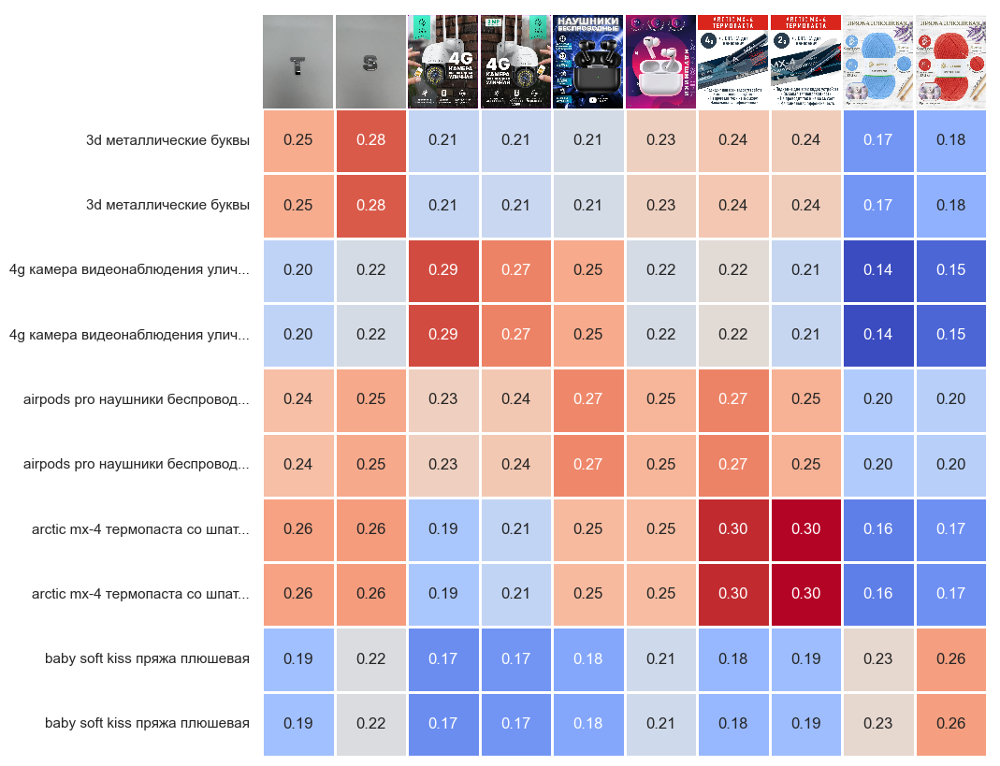

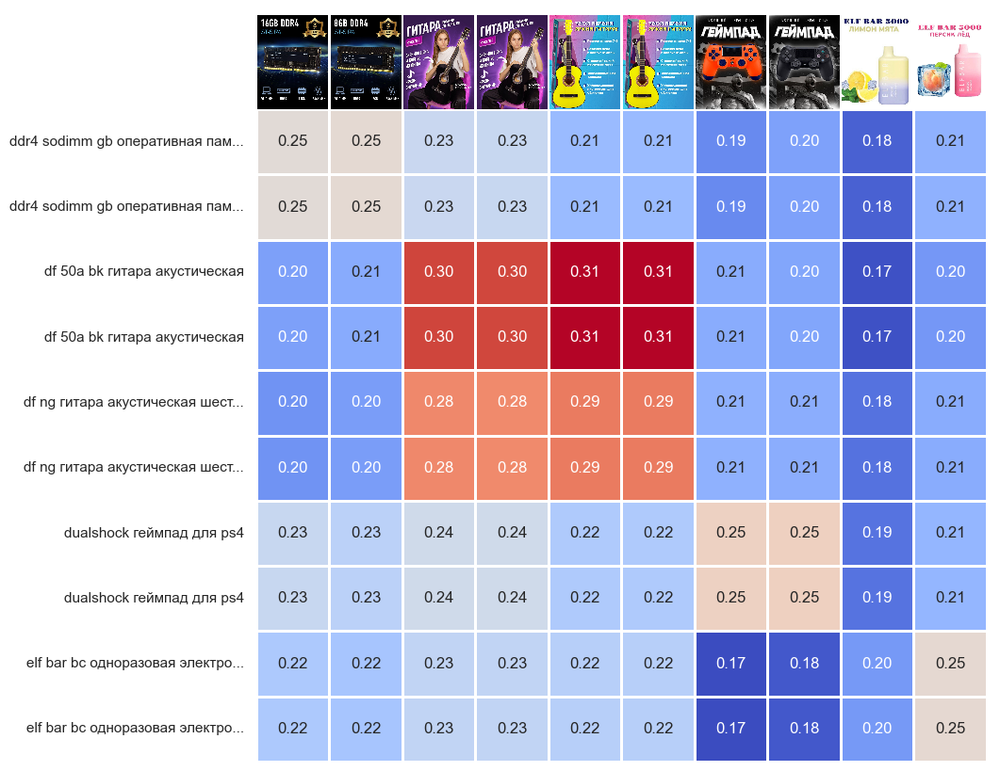

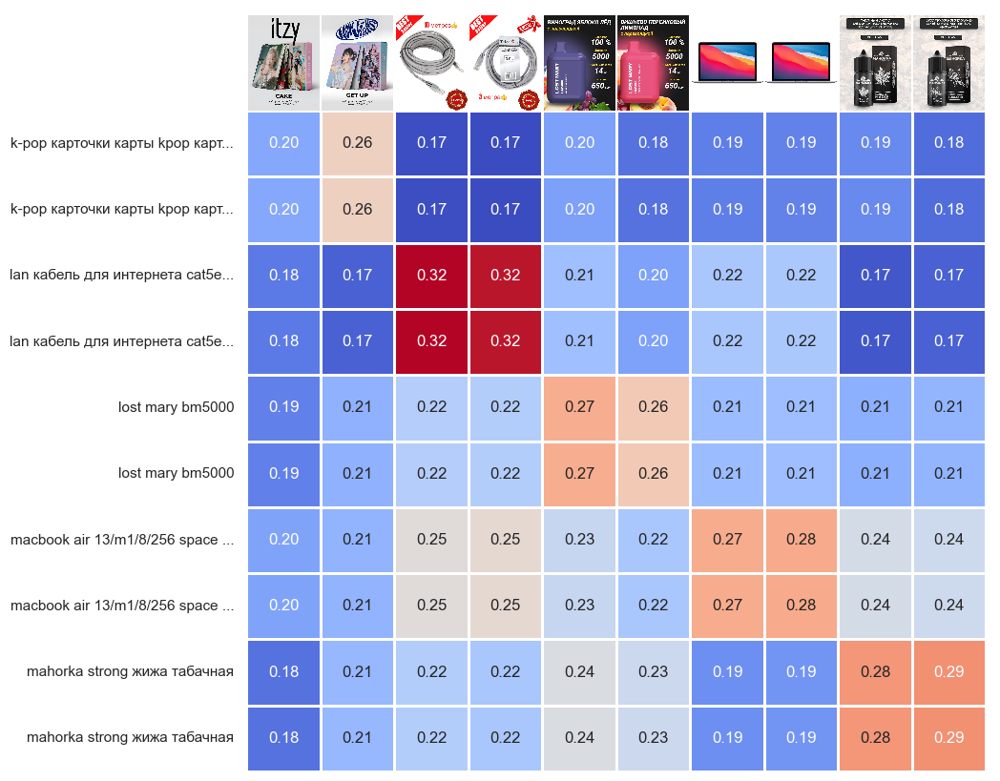

In [77]:
# выделим все дубликаты по паре заголовок-описание
all_dups = train[train.duplicated(subset=['title', 'description'], keep=False)].sort_values(by=['title', 'description'])
# пронумеруем все товары в группах дубликатов
all_dups['group_num'] = all_dups.groupby('title').title.rank(method='first')

# выделим только пары дубликатов
dup_pairs = all_dups[all_dups.group_num <= 2]

N = 10  # число товаров для одной матрицы

for i in [0, 5, 10]:
    part = dup_pairs.iloc[i * N:(i + 1) * N]
    images = get_images([str(id) + '.jpg' for id in part.nm])
    
    plot_similarities(part.title, images, 
                      np.array(part.title_vec.tolist()), 
                      np.array(part.img_vec.tolist()))

#### Характеристики

                 precision    recall  f1-score   support

без ограничений       0.05      0.18      0.07       153
   для взрослых       0.17      0.61      0.26       331
      для детей       0.65      0.51      0.57      2003
    для малышей       0.47      0.37      0.42      1044
 для подростков       0.30      0.08      0.13       871

       accuracy                           0.39      4402
      macro avg       0.33      0.35      0.29      4402
   weighted avg       0.48      0.39      0.41      4402



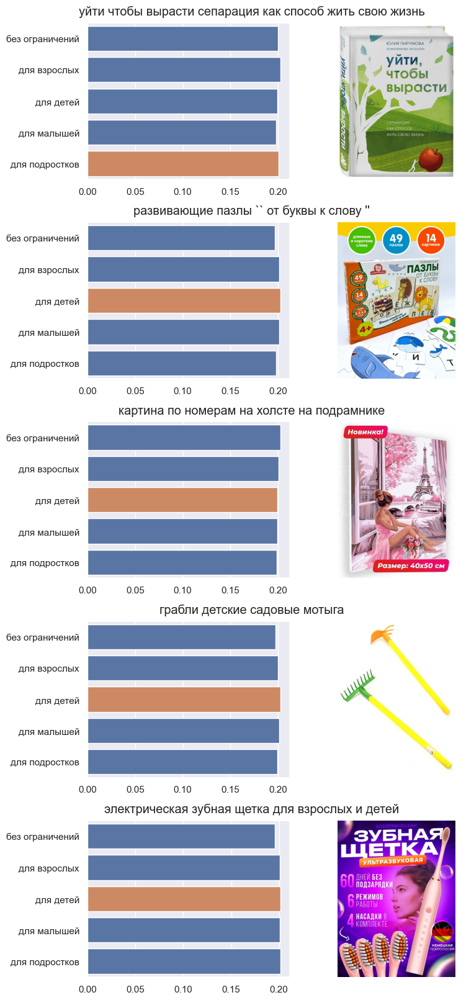

In [78]:
zero_shot_transfer_for_class(train, 'age_restrictions', text_model, 'clip-multilingual-v1', add_res_to_table=zero_shot_f1_all)

zero_shot_transfer_for_class(train, 'age_restrictions', text_model, 'clip-multilingual-v1',
                                 features=['title_vec', 'desc_vec'], show_report=False, plot_class_preds=False, 
                                 add_res_to_table=zero_shot_f1_text_only)

              precision    recall  f1-score   support

     Девочки       0.60      0.07      0.13      2379
     Детский       0.61      0.62      0.62      4597
     Женский       0.80      0.81      0.81     10614
    Мальчики       0.18      0.22      0.20      1226
     Мужской       0.42      0.60      0.50      3672

    accuracy                           0.63     22488
   macro avg       0.52      0.47      0.45     22488
weighted avg       0.65      0.63      0.61     22488



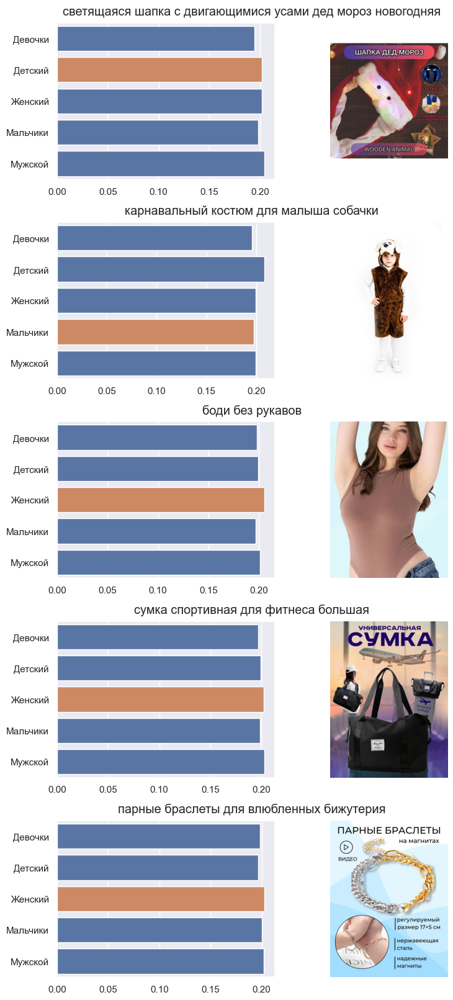

In [79]:
zero_shot_transfer_for_class(train, 'sex', text_model, 'clip-multilingual-v1', add_res_to_table=zero_shot_f1_all)

zero_shot_transfer_for_class(train, 'sex', text_model, 'clip-multilingual-v1',
                                 features=['title_vec', 'desc_vec'], show_report=False, plot_class_preds=False, 
                                 add_res_to_table=zero_shot_f1_text_only)

In [80]:
train['age_restrictions_short'] = train['age_restrictions'].replace(['без ограничений', 'для малышей', 'для подростков'], 
                                                                    ['для всех возрастов', 'для детей', 'для детей'])
train['sex_short'] = train['sex'].replace(['Мальчики', 'Девочки'], ['Детский', 'Детский'])

for param in tqdm(['age_restrictions_short', 'sex_short', 'season', 'fragility']):
    zero_shot_transfer_for_class(train, param, text_model, 'clip-multilingual-v1',
                                 show_report=False, plot_class_preds=False, add_res_to_table=zero_shot_f1_all)
    
    zero_shot_transfer_for_class(train, param, text_model, 'clip-multilingual-v1',
                                 features=['title_vec', 'desc_vec'], show_report=False, plot_class_preds=False, 
                                 add_res_to_table=zero_shot_f1_text_only)

  0%|          | 0/4 [00:00<?, ?it/s]

In [81]:
zero_shot_f1_all.style.highlight_max(color='lightgreen', axis=1)

### Linear probe

  0%|          | 0/4 [00:00<?, ?it/s]

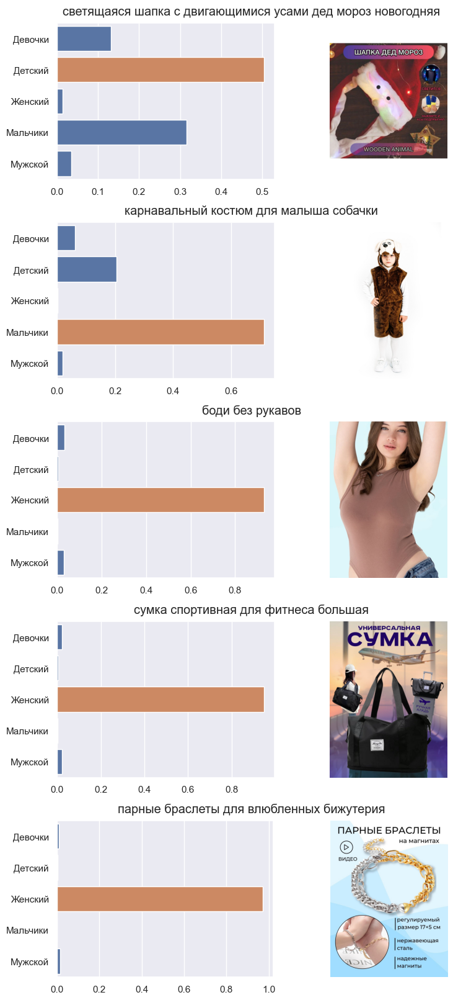

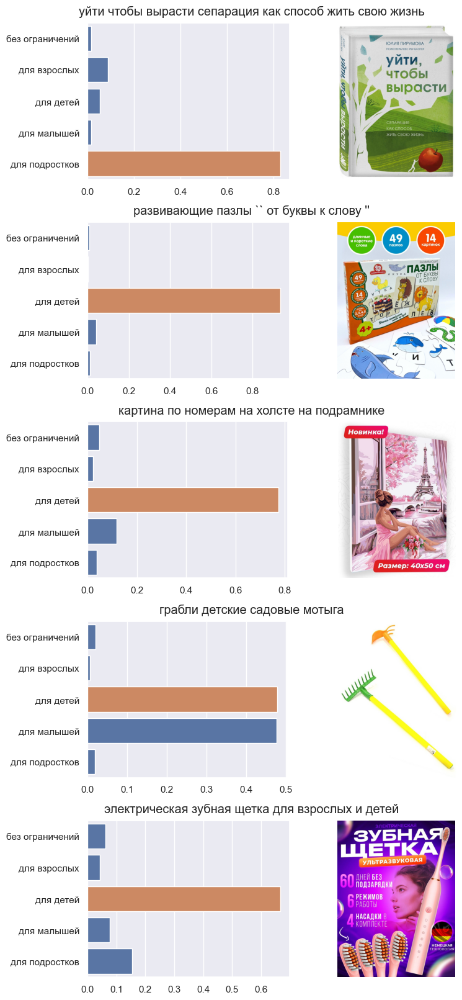

In [82]:
for col in tqdm(train.columns[4:-5]):
    X_train, X_test, y_train, y_test = get_data(train, col)
    n = X_train.shape[1] // 3
    
    # early fusion
    clf = LogisticRegression(solver='lbfgs', penalty='l2', max_iter=1000)
    early_fusion(X_train, y_train, X_test, y_test, clf, 'clip-multilingual-v1', (linprob_f1_all, col), show_report=False)
    early_fusion(X_train[:, n:], y_train, X_test[:, n:], y_test, clf, 'clip-multilingual-v1', (linprob_f1_text_only, col), show_report=False)

    # late fusion
    clfs = [LogisticRegression(solver='lbfgs', penalty='l2', max_iter=1000) for _ in range(4)]

    late_fusion(X_train, y_train, X_test, y_test, clfs, 'clip-multilingual-v1', (linprob_f1_all, col), show_report=False)
    
    if col in ['age_restrictions', 'sex']:
        plot_classification_image_title(train[train[col].notna()], col, clfs, fusion_type='late')
        
    late_fusion(X_train[:, n:], y_train, X_test[:, n:], y_test, clfs[1:], 'clip-multilingual-v1', (linprob_f1_text_only, col), show_report=False)

In [83]:
linprob_f1_all.style.highlight_max(color='lightgreen', axis=1)

In [84]:
linprob_f1_text_only.style.highlight_max(color='lightgreen', axis=1)

### Кластеризация

In [85]:
# берем средний вектор от векторов заголовка и изображения
train['mean_vec'] = train[['img_vec', 'title_vec', 'desc_vec']].apply(lambda x: np.mean(x, axis=0), axis=1)

In [86]:
# %%time
# reduced_xy = reducer_xy.fit_transform(train['mean_vec'].tolist())
# reduced_vecs = reducer.fit_transform(np.array(train['mean_vec'].tolist()))

# with open(path_to_files + 'clip_multilingual_umap_embeddings.pkl', 'wb') as f:
#     pickle.dump([reduced_xy, reduced_vecs], f)

In [87]:
with open(path_to_files + 'clip_multilingual_umap_embeddings.pkl', 'rb') as f:
    reduced_xy, reduced_vecs = pickle.load(f)

In [88]:
kmeans_list = [KMeans(n_clusters=n, random_state=0) for n in range(100, 1001, 100)]
scores = []

for kmeans in tqdm(kmeans_list):
    kmeans.fit(reduced_vecs)
    scores.append(silhouette_score(reduced_vecs, kmeans.predict(reduced_vecs), sample_size=10000))

  0%|          | 0/10 [00:00<?, ?it/s]

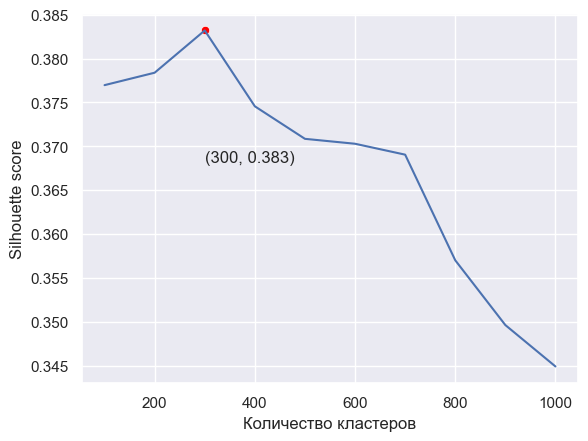

In [89]:
n_clusters = list(range(100, 1001, 100))
plot_cluster_scores(n_clusters, scores)

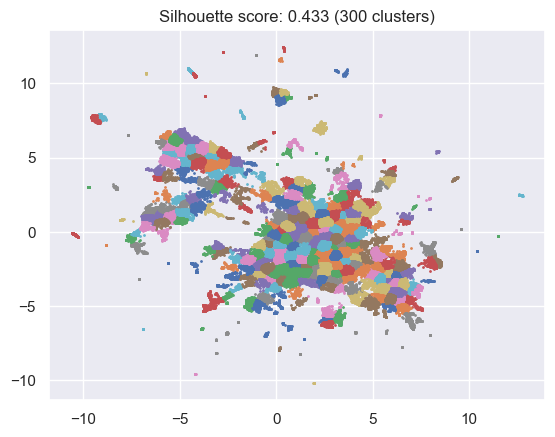

In [90]:
max_score = max(scores)
best_n = n_clusters[scores.index(max_score)]

plot_best_cluster(best_n, reduced_xy)

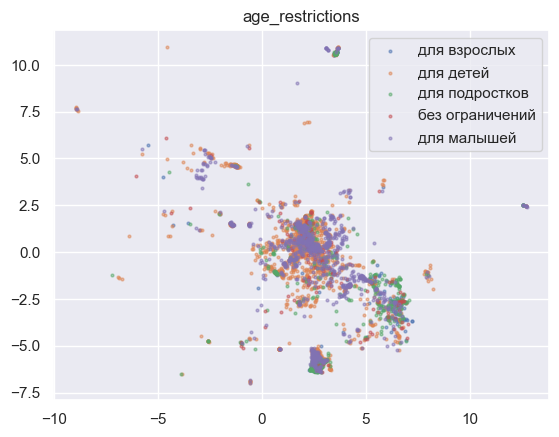

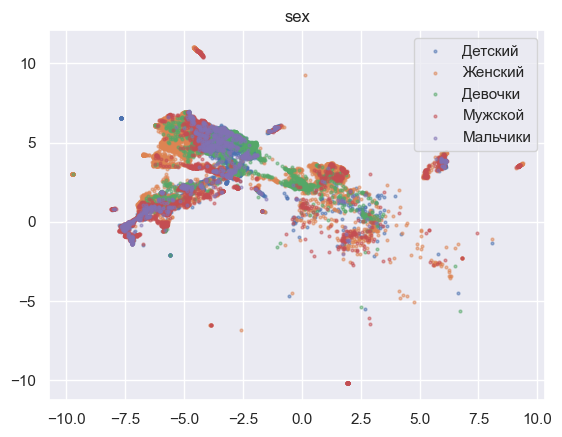

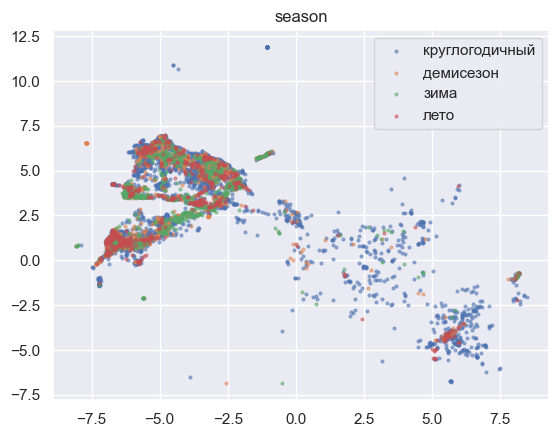

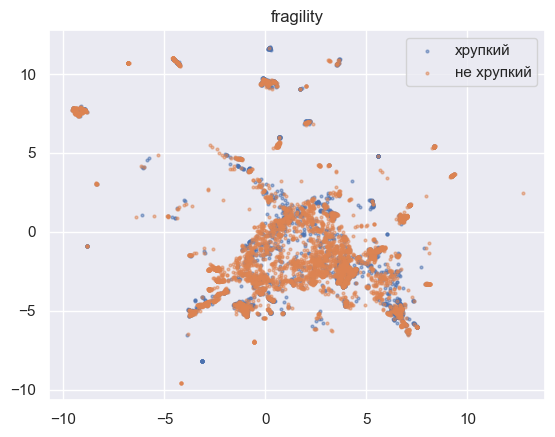

In [91]:
for param in ['age_restrictions', 'sex', 'season', 'fragility']:

    kmeans = KMeans(n_clusters=best_n, random_state=0)
    kmeans.fit(reduced_xy)

    labels = kmeans.predict(reduced_xy)
    df = pd.DataFrame({'x': reduced_xy[:, 0], 'y': reduced_xy[:, 1], 'label': train[param]})

    for label in df.label.unique():
        if label is not np.nan:
            plt.scatter(df[df.label == label].x, df[df.label == label].y, s=4, label=label, alpha=0.5)

    plt.legend()
    plt.title(f'{param}')
    plt.show()

In [92]:
res = pd.DataFrame(columns=pd.MultiIndex.from_product([['clip-multilingual-v1'],['AMI', 'Homogeneity', 'Completeness', 'V-Measure']]))
clusterisation_results = pd.concat([clusterisation_results, res], axis=1)

In [93]:
for param in train.columns[4:-6]:
    idxs = train[train[param].notna()].index
    labels = kmeans_list[scores.index(max_score)].predict(reduced_vecs[idxs])
    
    clusterisation_results.loc[param, [('clip-multilingual-v1', 'AMI'), 
                                       ('clip-multilingual-v1', 'Homogeneity'), 
                                       ('clip-multilingual-v1', 'Completeness'), 
                                       ('clip-multilingual-v1', 'V-Measure')]] = [
        adjusted_mutual_info_score(train.loc[idxs, param], labels),
        homogeneity_score(train.loc[idxs, param], labels),
        completeness_score(train.loc[idxs, param], labels),
        v_measure_score(train.loc[idxs, param], labels)
    ]

In [94]:
clusterisation_results

ruclip                                     \
                       AMI Homogeneity Completeness V-Measure   
sex               0.169268    0.368752     0.113153  0.173169   
age_restrictions  0.168877    0.375033     0.131064  0.194244   
season            0.108258    0.268287     0.075686  0.118065   
fragility         0.032989    0.174354     0.023205  0.040959   

                 clip-multilingual-v1                                     
                                  AMI Homogeneity Completeness V-Measure  
sex                          0.205673     0.42639     0.139047  0.209708  
age_restrictions             0.145167    0.340808     0.113549  0.170343  
season                       0.064946    0.164104     0.048036  0.074318  
fragility                    0.025958    0.130818     0.018144  0.031868

## `rubert-tiny2`

In [95]:
tokenizer = AutoTokenizer.from_pretrained("cointegrated/rubert-tiny2")
text_model = AutoModel.from_pretrained("cointegrated/rubert-tiny2")

In [96]:
# test = test.drop(['img_vec', 'title_vec', 'desc_vec'], axis=1)

# test['title_vec'] = test['title'].progress_apply(lambda x: get_bert_embeddings(x, text_model, tokenizer))
# test['desc_vec'] = test['description'].progress_apply(lambda x: get_bert_embeddings(x, text_model, tokenizer))

# test[['nm', 'title_vec', 'desc_vec']].to_parquet(path_to_files + 'test_rubert_tiny.parquet')

In [97]:
# train[['nm', 'title_vec', 'desc_vec']].to_parquet(path_to_files + 'train_rubert_tiny.parquet')

In [98]:
def get_saved_bert_embeddings(df_name, model_name):
    df = pd.read_parquet(path_to_files + f'{df_name}_preprocessed.parquet')

    text_vecs = pd.read_parquet(path_to_files + f'{df_name}_{model_name}.parquet')

    return df.merge(text_vecs, on='nm', how='left')

In [99]:
train = get_saved_bert_embeddings('train', 'rubert_tiny2')
# test = get_saved_bert_embeddings('test', 'rubert_tiny2')

train['age_restrictions_short'] = train['age_restrictions'].replace(['без ограничений', 'для малышей', 'для подростков'], 
                                                                    ['для всех возрастов', 'для детей', 'для детей'])
train['sex_short'] = train['sex'].replace(['Мальчики', 'Девочки'], ['Детский', 'Детский'])

### Zero-shot transfer

In [100]:
for param in tqdm(['age_restrictions', 'age_restrictions_short', 'sex', 'sex_short', 'season', 'fragility']):
    zero_shot_transfer_for_class(train, param, text_model, 'rubert_tiny2', tokenizer=tokenizer,
                                 features=['title_vec', 'desc_vec'], show_report=False, plot_class_preds=False, 
                                 add_res_to_table=zero_shot_f1_text_only)

  0%|          | 0/6 [00:00<?, ?it/s]

In [101]:
zero_shot_f1_text_only.style.highlight_max(color='lightgreen', axis=1)

### Linear probe

In [102]:
for col in tqdm(train.columns[4:-4]):
    X_train, X_test, y_train, y_test = get_data(train, col, is_img=False)

    # early fusion
    clf = LogisticRegression(solver='lbfgs', penalty='l2', max_iter=1000)
    early_fusion(X_train, y_train, X_test, y_test, clf, 'rubert_tiny2', (linprob_f1_text_only, col), show_report=False)

    # late fusion
    clfs = [LogisticRegression(solver='lbfgs', penalty='l2', max_iter=1000) for _ in range(3)]
    late_fusion(X_train, y_train, X_test, y_test, clfs, 'rubert_tiny2', (linprob_f1_text_only, col), show_report=False)

  0%|          | 0/4 [00:00<?, ?it/s]

In [103]:
linprob_f1_text_only.style.highlight_max(color='lightgreen', axis=1)

## ruRoBERTa

In [104]:
tokenizer = AutoTokenizer.from_pretrained("ai-forever/ruRoberta-large")
text_model = AutoModel.from_pretrained("ai-forever/ruRoberta-large")

Some weights of RobertaModel were not initialized from the model checkpoint at ai-forever/ruRoberta-large and are newly initialized: ['roberta.pooler.dense.bias', 'roberta.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [105]:
# test = test.drop(['title_vec', 'desc_vec'], axis=1)

# test['title_vec'] = test['title'].progress_apply(lambda x: get_bert_embeddings(x, text_model, tokenizer))
# train['title_vec'] = train['title'].progress_apply(lambda x: get_bert_embeddings(x, text_model, tokenizer))

# test[['nm', 'title_vec']].to_parquet(path_to_files + 'train_ruroberta.parquet')

In [106]:
train = get_saved_bert_embeddings('train', 'ruroberta')
# test = get_saved_bert_embeddings('test', 'ruroberta')

train['age_restrictions_short'] = train['age_restrictions'].replace(['без ограничений', 'для малышей', 'для подростков'], 
                                                                    ['для всех возрастов', 'для детей', 'для детей'])
train['sex_short'] = train['sex'].replace(['Мальчики', 'Девочки'], ['Детский', 'Детский'])

### Zero-shot transfer

In [107]:
for param in tqdm(['age_restrictions', 'age_restrictions_short', 'sex', 'sex_short', 'season', 'fragility']):
    zero_shot_transfer_for_class(train, param, text_model, 'ruroberta', tokenizer=tokenizer,
                                 features=['title_vec'], show_report=False, plot_class_preds=False, 
                                 add_res_to_table=zero_shot_f1_text_only)

  0%|          | 0/6 [00:00<?, ?it/s]

In [108]:
zero_shot_f1_text_only.style.highlight_max(color='lightgreen', axis=1)

### Linear probe

In [109]:
for col in tqdm(train.columns[4:-3]):
    df = train[train[col].notna()].copy()
    X_train, X_test, y_train, y_test = train_test_split(np.array(df['title_vec'].tolist()), df[col].values, test_size=0.25, random_state=42)

    # early fusion
    clf = LogisticRegression(solver='lbfgs', penalty='l2', max_iter=1000)
    early_fusion(X_train, y_train, X_test, y_test, clf, 'ruroberta', (linprob_f1_text_only, col), show_report=False)

    # late fusion
    clfs = [LogisticRegression(solver='lbfgs', penalty='l2', max_iter=1000) for _ in range(3)]
    late_fusion(X_train, y_train, X_test, y_test, clfs, 'ruroberta', (linprob_f1_text_only, col), show_report=False)

  0%|          | 0/4 [00:00<?, ?it/s]

In [110]:
linprob_f1_text_only.style.highlight_max(color='lightgreen', axis=1)

# Вывод

По совокупности всех результатов наиболее перспективной выглядит модель `ruCLIP`, даже несмотря на маленькое контекстное окно текстового энкодера. 

In [111]:
zero_shot_f1_text_only.style.highlight_max(color='lightgreen', axis=1)

In [112]:
linprob_f1_text_only.style.highlight_max(color='lightgreen', axis=1)

In [113]:
# import torchvision
# from torchvision import transforms
# from torch.utils.data import Dataset, DataLoader
# import torch.nn as nn

In [114]:
# img_model = torchvision.models.vit_b_32(pretrained=True)
# img_model.heads = nn.Sequential()

In [115]:
# class ImageDataset(Dataset):
    
#     def __init__(self, image_names, rescale_size=224, path_to_zip='D:/HorizontalML/wb_school_horizcv_images.zip'):
#         self.image_names = image_names
#         self.rescale_size = rescale_size
#         self.path_to_zip = path_to_zip
        
#         self.transforms = transforms.Compose([
#             transforms.ToTensor(),
#             transforms.Resize((rescale_size, rescale_size)),
#             transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
#         ])
        
#     def __len__(self):
#         return len(self.image_names)
    
#     def __getitem__(self, idx):
#         with zipfile.ZipFile(self.path_to_zip, 'r') as zf:
#             image = Image.open(zf.open(f'{self.image_names[idx]}.jpg'))
            
#         if image.mode == 'RGB':
#             # переводим из формата BGR в RGB
#                 B, G, R = image.split()
#                 image = Image.merge("RGB", (R, G, B))
                
#         elif image.mode == 'L':
#             # переводим из серого в RGB
#             image = image.convert('RGB')
            
#         image = np.array(image, dtype=np.float32) / 255
#         image = self.transforms(image)
        
#         return image